In [8]:
import os
import math
import numpy as np
import matplotlib.pyplot as plt
import pickle
import optuna
import pandas as pd
import datetime
import pickle

In [2]:
optuna_job_ids = []
propulate_job_ids = []

function_names = ['sphere', 'rosenbrock', 'step', 'quartic', 'rastrigin', 'griewank', 'schwefel', 'bisphere', 'birastrigin']
root = '/hkfs/work/workspace/scratch/ku4408-Propulate/function_results_final'

In [3]:
width = 347.12354  # pt
inches_per_pt = 0.01383486
width = width * inches_per_pt
height = width / 1.618

In [4]:
def load_propulate(root, num_islands):
    pops = []
    for i in range(num_islands):
        with open(f"{root}/isle_{i}_pop_cpt.p", "rb") as f:
            pop = pickle.load(f)
            pops.append(pop)

    return pops

def get_propulate_times_losses(pops):
                
    flat_pops = [ind for pop in pops for ind in pop]
    actives = [ind for ind in flat_pops if ind.active == True]
    actives.sort(key=lambda x: x.evaltime)
    losses = np.array([ind.loss for ind in actives])
    times = np.array([ind.evaltime for ind in actives])
    times = times - times[0]
    return times, losses
    
def get_propulate_time_size_evals(pops):
    flat_pops = [ind for pop in pops for ind in pop]
    actives = [ind for ind in flat_pops if ind.active == True]
    actives.sort(key=lambda x : x.evaltime)
    size = max([(x.rank + 1)*(x.isle + 1) for x in actives])
    time = max([(x.evaltime - actives[0].evaltime)/3600 for x in actives])
    num_evals = len(actives)
    
    return time, size, num_evals
    

In [5]:
def load_optuna_csv(path):
    return pd.read_csv(path)

def get_optuna_times_losses(dataframe):
    
    # print(dataframe)
    times = [datetime.datetime.strptime(x, '%Y-%m-%d %H:%M:%S') for x in dataframe['datetime_complete'].to_list()]
    losses = np.array(dataframe['value'].to_list())
    idx_sorted = np.argsort(times)
    
    times = np.array([(t - times[idx_sorted[0]]).total_seconds() for t in times])
    
    times = times[idx_sorted]
    losses = losses[idx_sorted]
    return times, losses
    

def get_optuna_time_size_evals(dataframe):
    pass

In [6]:
def get_running(losses):
    running_medi = [losses[0]]
    running_mini = [losses[0]]
    running_maxi = [losses[0]]
    
    for i in range(1, len(losses)):
        medi = np.median(losses[:i])
        mini = np.amin(losses[:i])
        maxi = np.amax(losses[:i])
        running_medi.append(medi)
        running_mini.append(mini)
        running_maxi.append(maxi)
    
    running_medi = np.array(running_medi)
    running_maxi = np.array(running_maxi)
    running_mini = np.array(running_mini)
    return running_mini, running_medi, running_maxi

In [7]:
def plot_loss_evolution(times,
                        losses,
                        running_mini,
                        running_medi,
                        running_maxi,
                        fname=''):
    
    fig, axs = plt.subplots(figsize=(width, height))
    ms = 0.5
    fs = 10
    plt.suptitle('Optimization of '+ fname)
    #plt.sca(axs[0])
    plt.ylabel('Loss (arb.u.)', fontweight="bold")
    plt.xlabel('Time  (s)', fontweight="bold")
    plt.grid()
    #plt.title('Propulate', fontsize=fs, fontweight="bold")
    plt.semilogy(times, losses, ls='None', marker='o', markersize=ms, color='C7', alpha=0.1)
    plt.semilogy(times, running_maxi, c='k', label='maximum')
    plt.semilogy(times, running_medi, label='median', c='cornflowerblue')
    plt.semilogy(times, running_mini, label='minimum', c='goldenrod')
    #plt.legend()
    plt.show()
    print(f"Overall number of candidates evaluated: {len(losses)}")

Evolution per run plots

sphere
[1891183, 1891184, 1891181, 1891187, 1891185, 1891190, 1891182, 1891188, 1891189, 1891186]


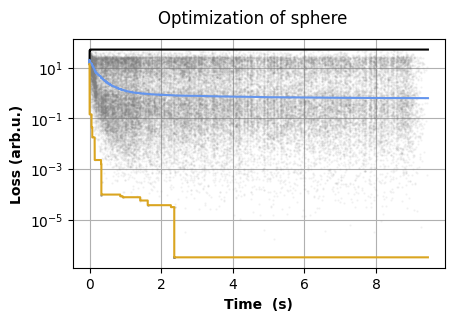

Overall number of candidates evaluated: 38912


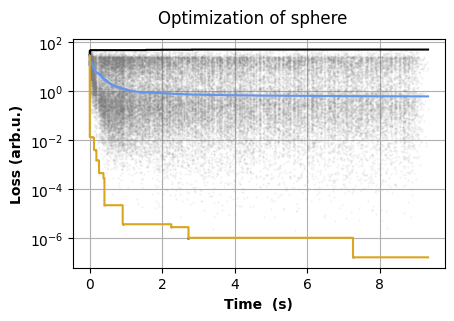

Overall number of candidates evaluated: 38912


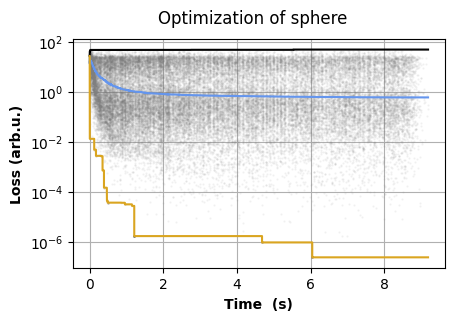

Overall number of candidates evaluated: 38912


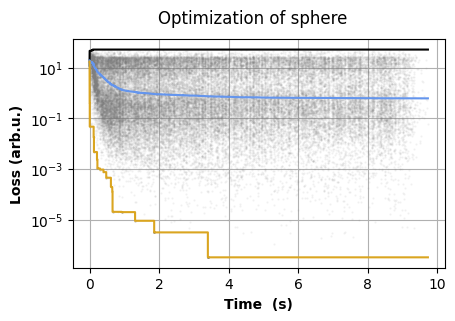

Overall number of candidates evaluated: 38912


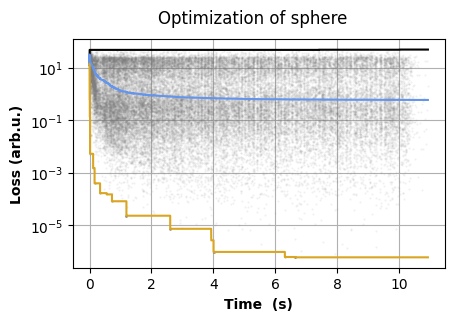

Overall number of candidates evaluated: 38912


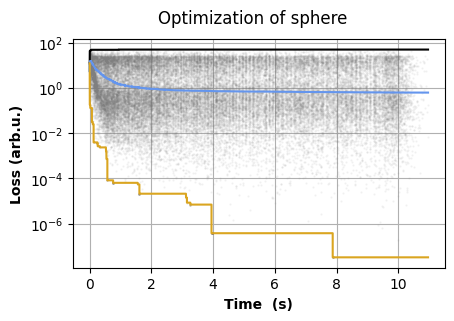

Overall number of candidates evaluated: 38912


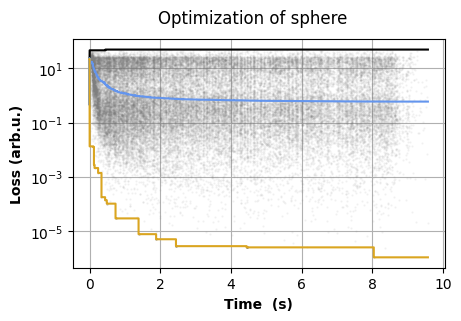

Overall number of candidates evaluated: 38912


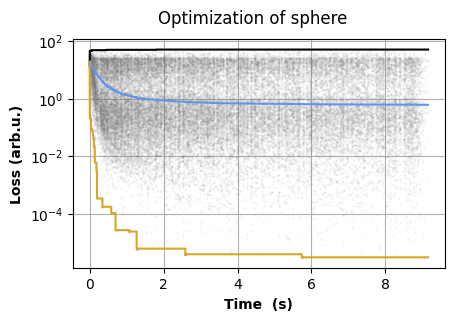

Overall number of candidates evaluated: 38912


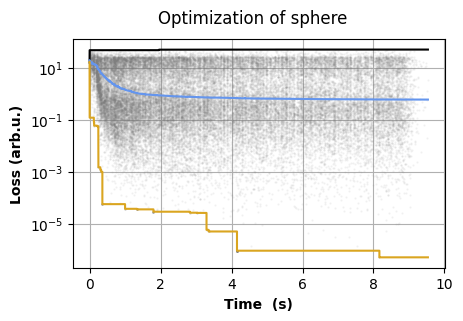

Overall number of candidates evaluated: 38912


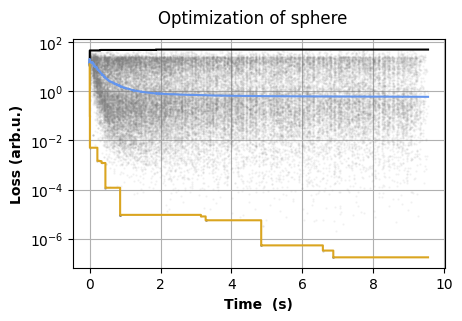

Overall number of candidates evaluated: 38912
rosenbrock
[1891165, 1891170, 1891162, 1891163, 1891169, 1891166, 1891164, 1891161, 1891167, 1891168]


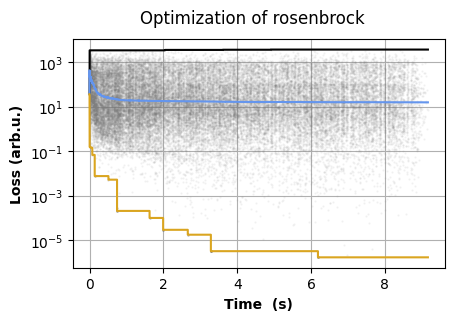

Overall number of candidates evaluated: 38912


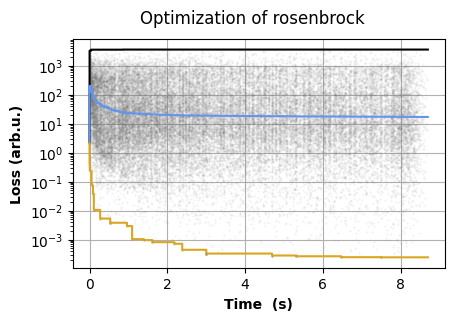

Overall number of candidates evaluated: 38912


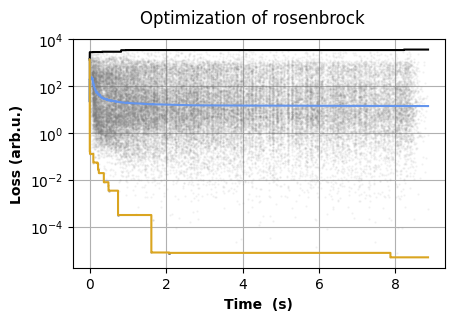

Overall number of candidates evaluated: 38912


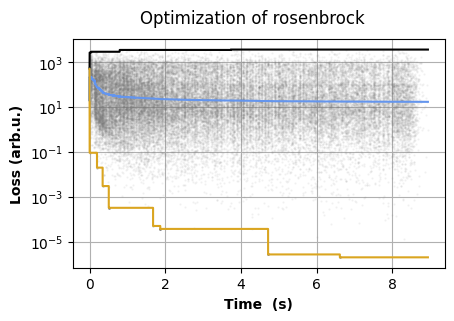

Overall number of candidates evaluated: 38912


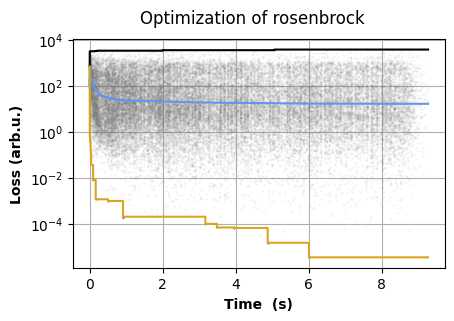

Overall number of candidates evaluated: 38912


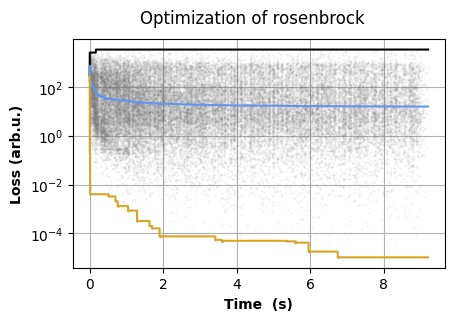

Overall number of candidates evaluated: 38912


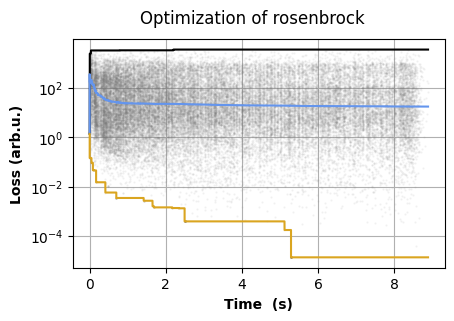

Overall number of candidates evaluated: 38912


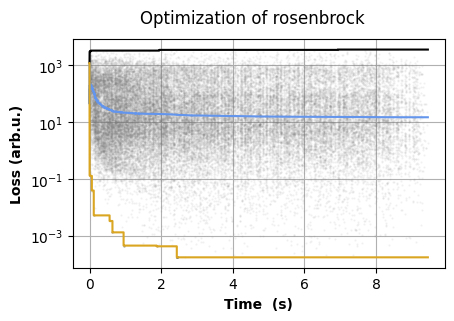

Overall number of candidates evaluated: 38912


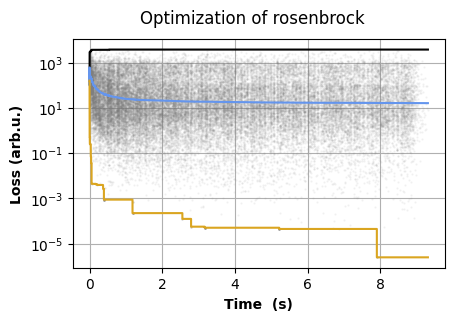

Overall number of candidates evaluated: 38912


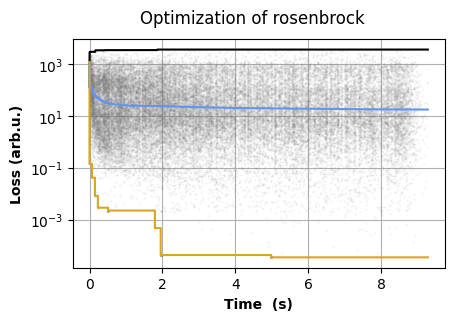

Overall number of candidates evaluated: 38912
step
[1891197, 1891195, 1891200, 1891192, 1891198, 1891196, 1891193, 1891194, 1891199, 1891191]


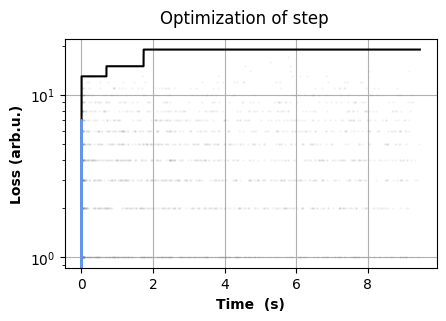

Overall number of candidates evaluated: 38912


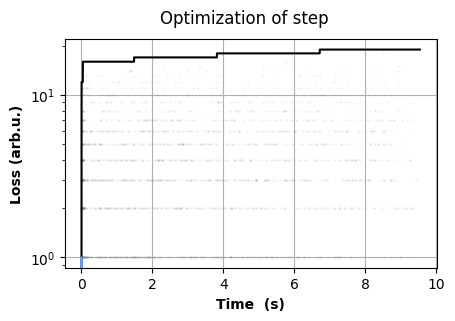

Overall number of candidates evaluated: 38912


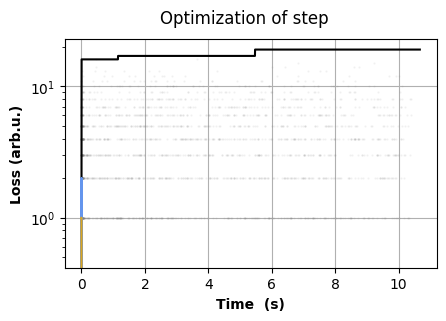

Overall number of candidates evaluated: 38912


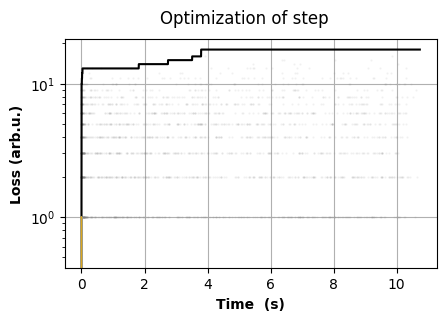

Overall number of candidates evaluated: 38912


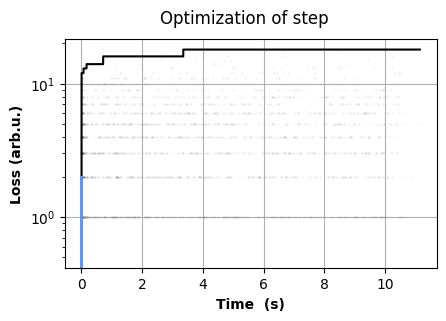

Overall number of candidates evaluated: 38912


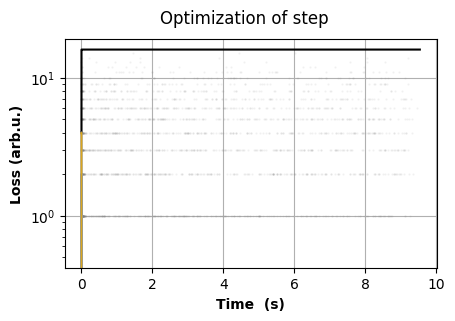

Overall number of candidates evaluated: 38912


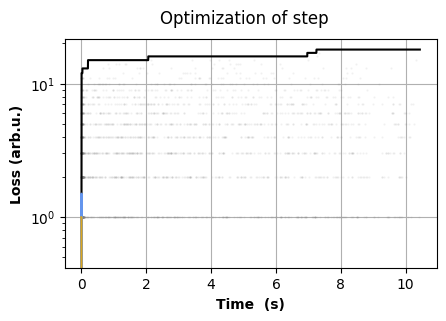

Overall number of candidates evaluated: 38912


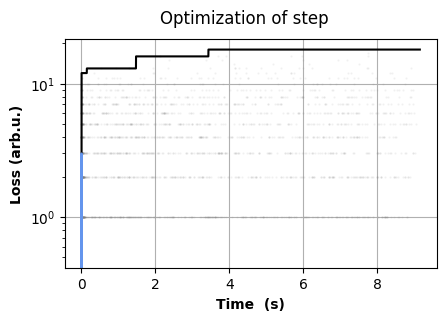

Overall number of candidates evaluated: 38912


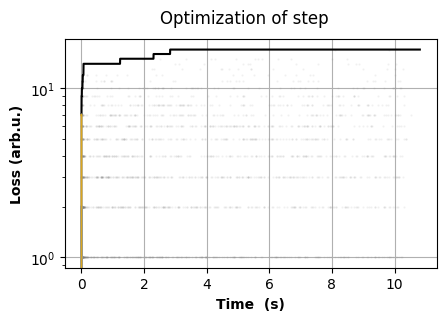

Overall number of candidates evaluated: 38912


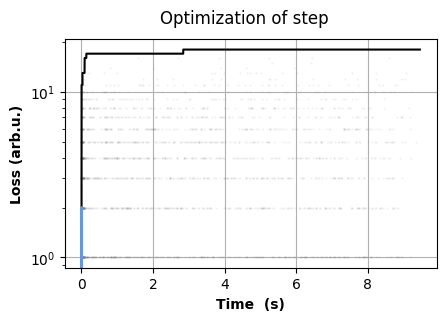

Overall number of candidates evaluated: 38912
quartic
[1891147, 1891144, 1891142, 1891148, 1891145, 1891150, 1891143, 1891149, 1891141, 1891146]


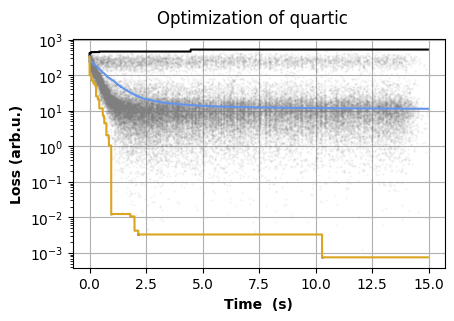

Overall number of candidates evaluated: 38912


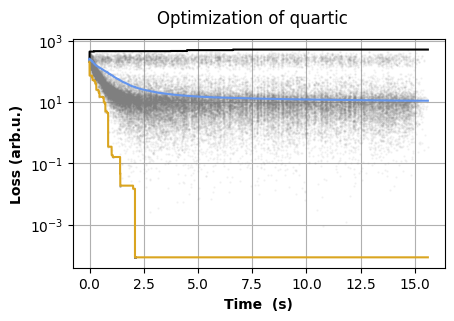

Overall number of candidates evaluated: 38912


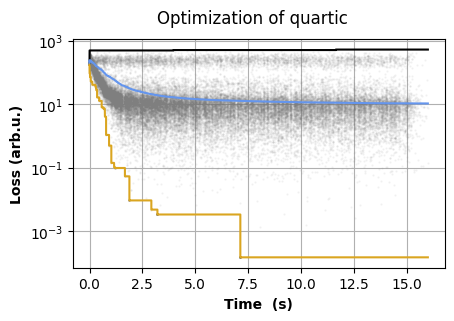

Overall number of candidates evaluated: 38912


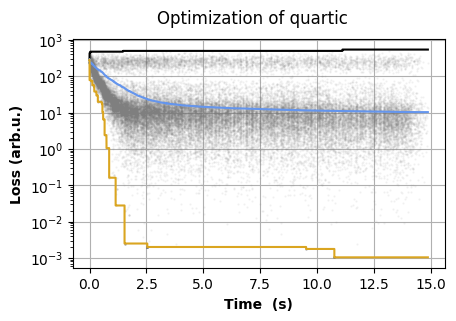

Overall number of candidates evaluated: 38912


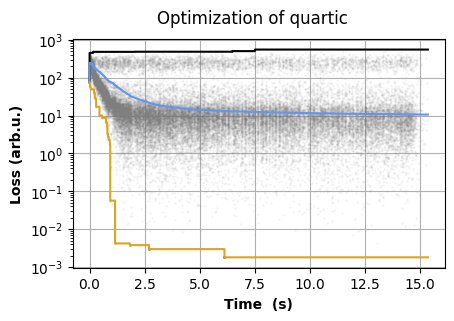

Overall number of candidates evaluated: 38912


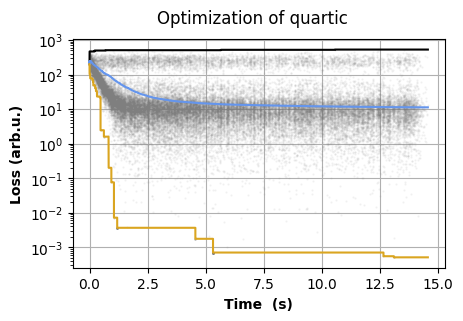

Overall number of candidates evaluated: 38912


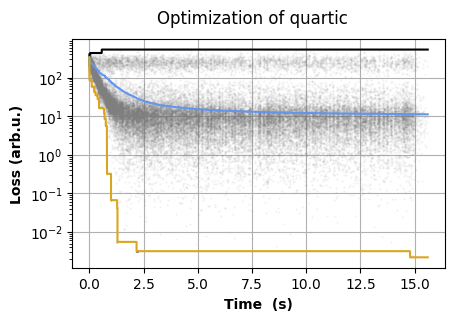

Overall number of candidates evaluated: 38912


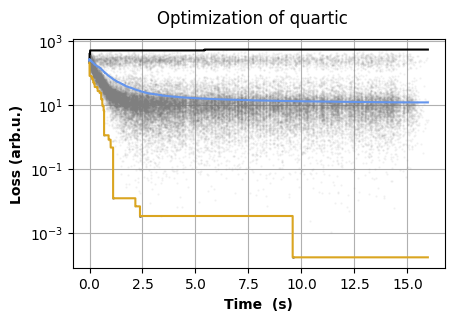

Overall number of candidates evaluated: 38912


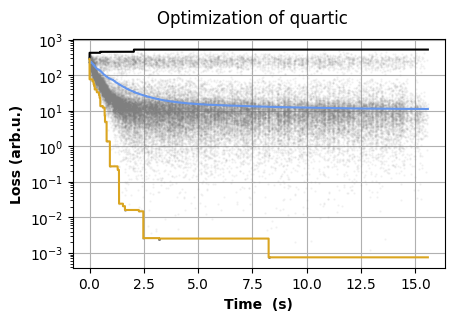

Overall number of candidates evaluated: 38912


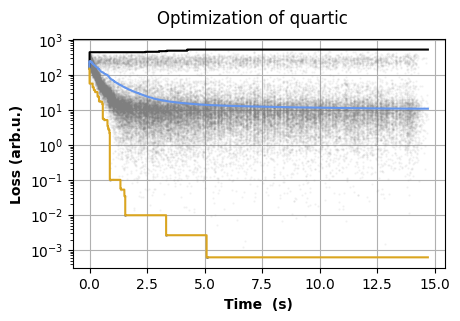

Overall number of candidates evaluated: 38912
rastrigin
[1891151, 1891152, 1891158, 1891155, 1891160, 1891153, 1891159, 1891156, 1891157, 1891154]


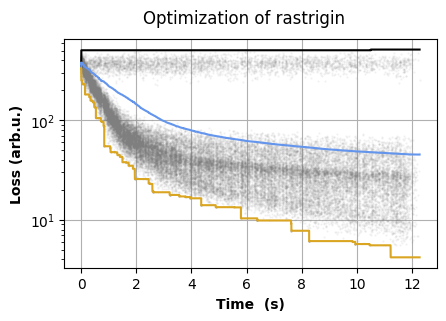

Overall number of candidates evaluated: 38912


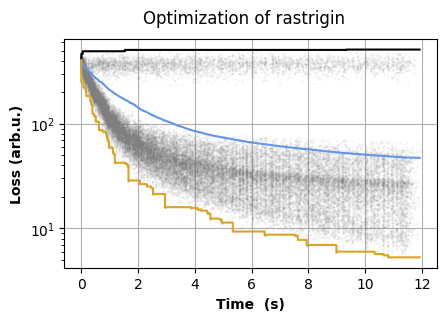

Overall number of candidates evaluated: 38912


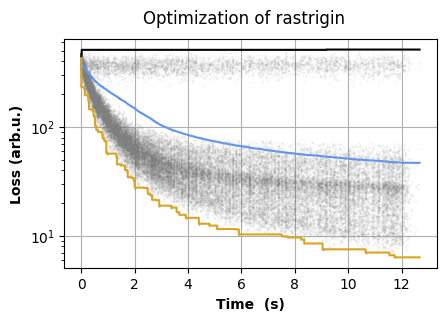

Overall number of candidates evaluated: 38912


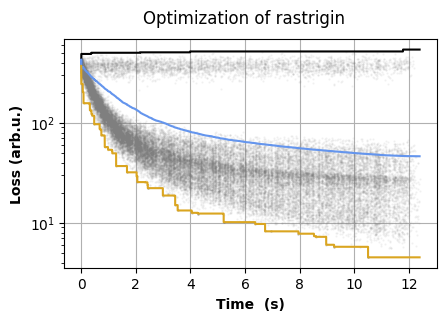

Overall number of candidates evaluated: 38912


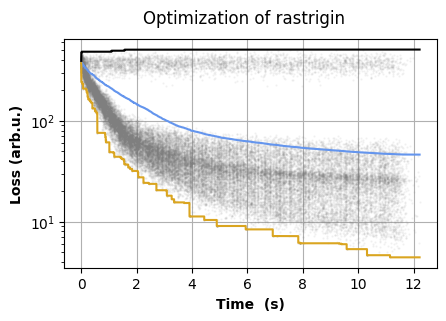

Overall number of candidates evaluated: 38912


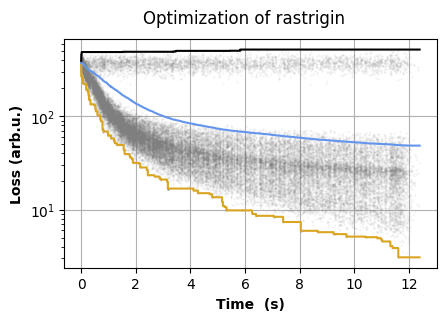

Overall number of candidates evaluated: 38912


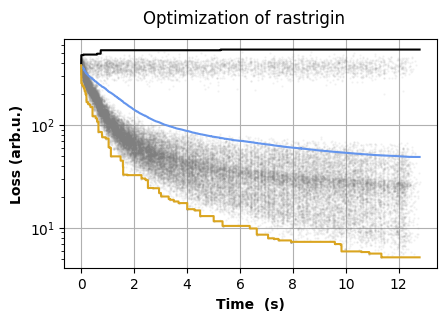

Overall number of candidates evaluated: 38912


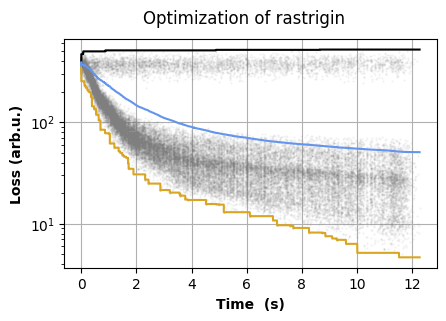

Overall number of candidates evaluated: 38912


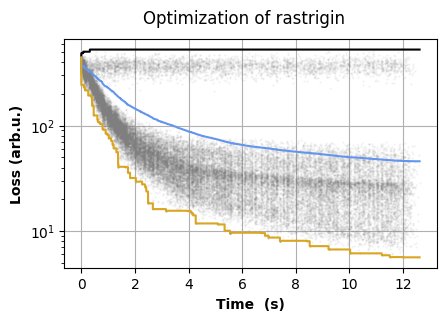

Overall number of candidates evaluated: 38912


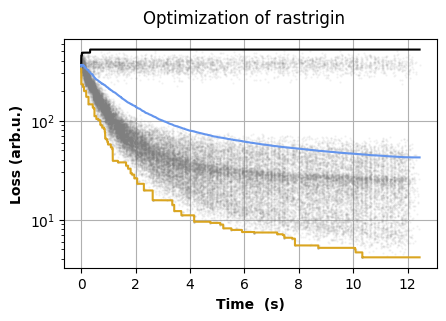

Overall number of candidates evaluated: 38912
griewank
[1892657, 1892665, 1892662, 1892660, 1892659, 1892656, 1892664, 1892658, 1892663, 1892661]


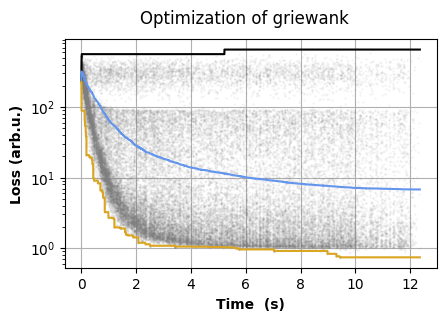

Overall number of candidates evaluated: 38912


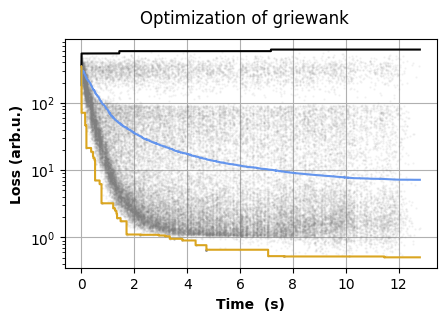

Overall number of candidates evaluated: 38912


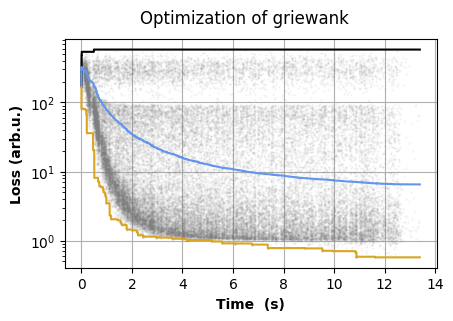

Overall number of candidates evaluated: 38912


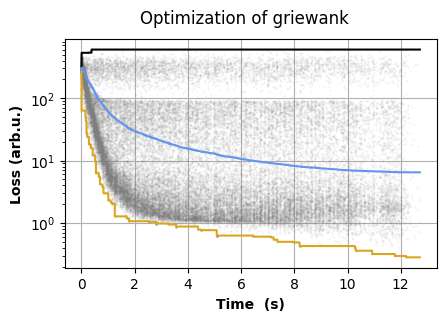

Overall number of candidates evaluated: 38912


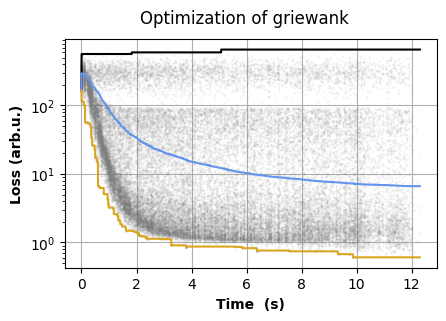

Overall number of candidates evaluated: 38912


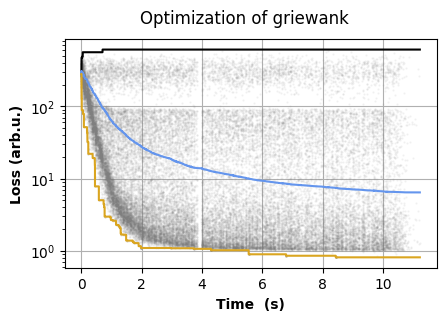

Overall number of candidates evaluated: 38912


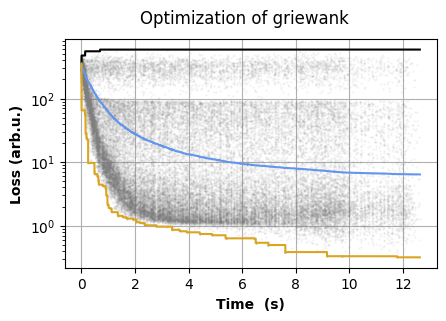

Overall number of candidates evaluated: 38912


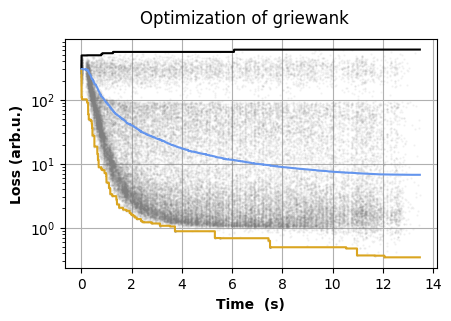

Overall number of candidates evaluated: 38912


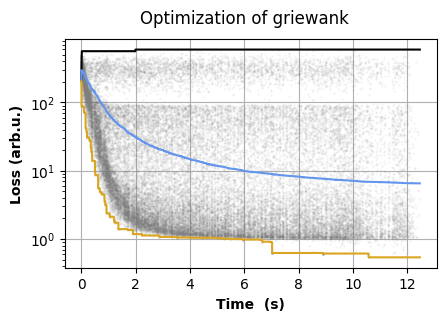

Overall number of candidates evaluated: 38912


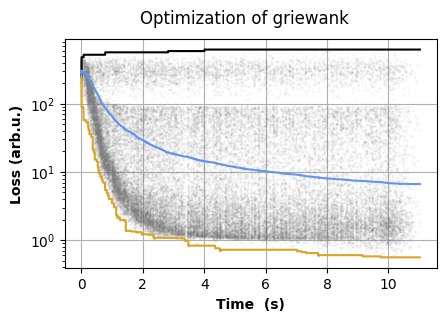

Overall number of candidates evaluated: 38912
schwefel
[1891179, 1891176, 1891174, 1891171, 1891177, 1891175, 1891180, 1891172, 1891173, 1891178]


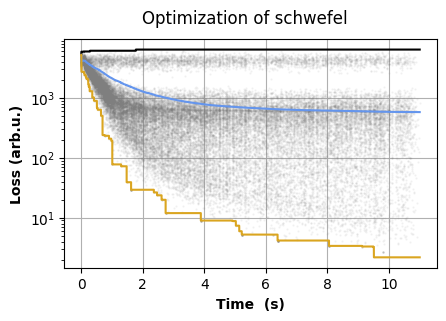

Overall number of candidates evaluated: 38912


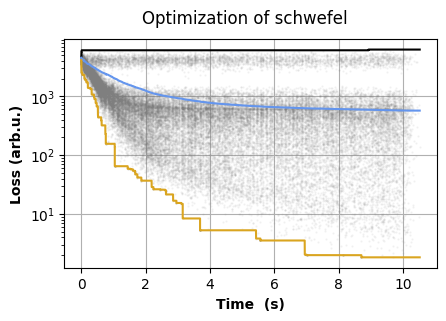

Overall number of candidates evaluated: 38912


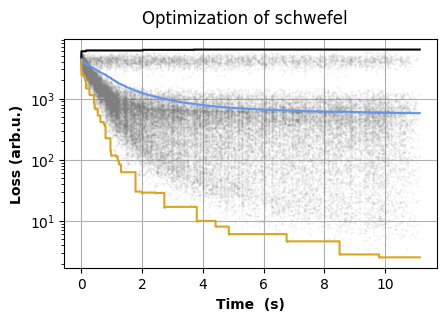

Overall number of candidates evaluated: 38912


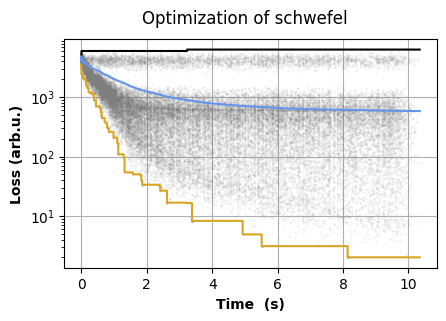

Overall number of candidates evaluated: 38912


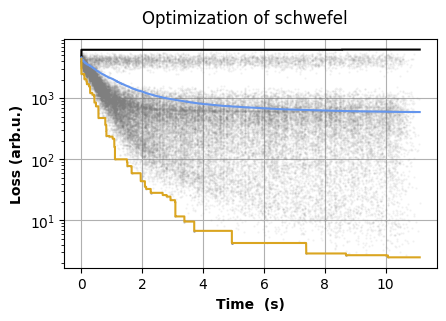

Overall number of candidates evaluated: 38912


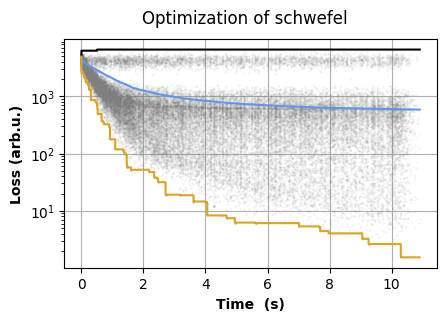

Overall number of candidates evaluated: 38912


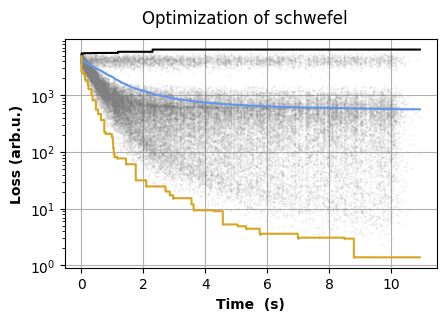

Overall number of candidates evaluated: 38912


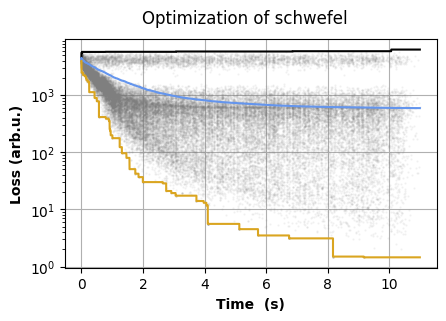

Overall number of candidates evaluated: 38912


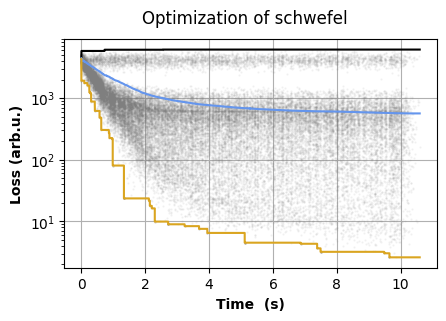

Overall number of candidates evaluated: 38912


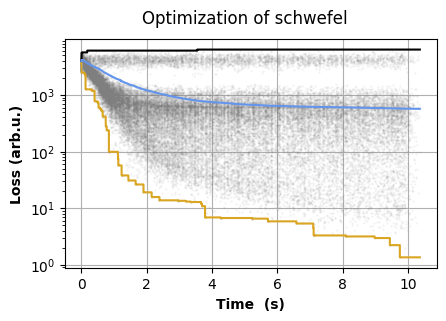

Overall number of candidates evaluated: 38912
bisphere
[1891125, 1891126, 1891130, 1891123, 1891129, 1891121, 1891127, 1891124, 1891122, 1891128]


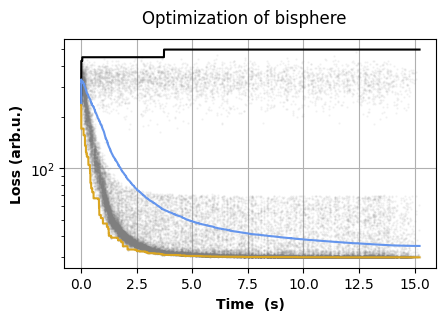

Overall number of candidates evaluated: 38912


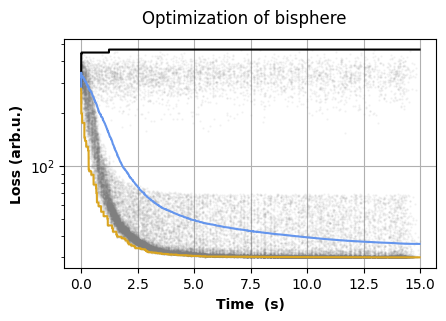

Overall number of candidates evaluated: 38912


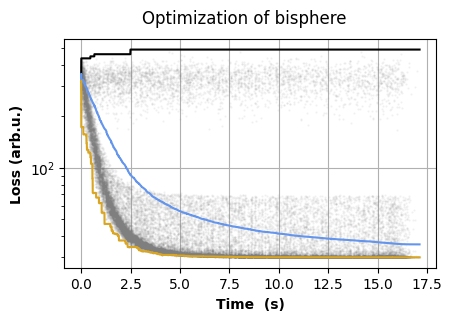

Overall number of candidates evaluated: 38912


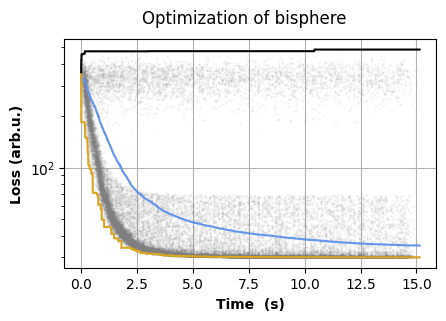

Overall number of candidates evaluated: 38912


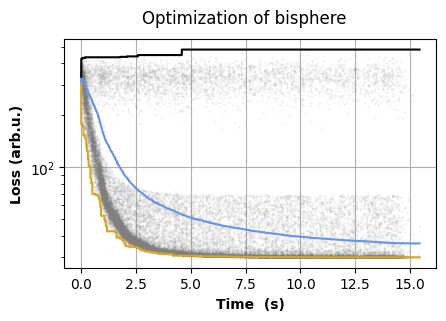

Overall number of candidates evaluated: 38912


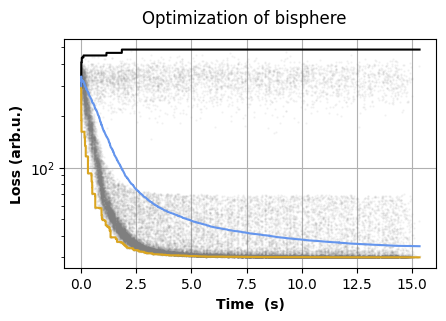

Overall number of candidates evaluated: 38912


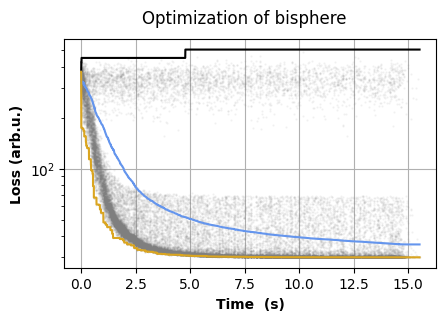

Overall number of candidates evaluated: 38912


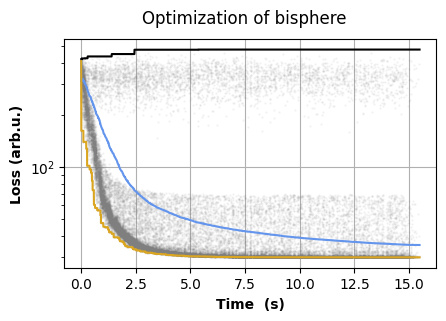

Overall number of candidates evaluated: 38912


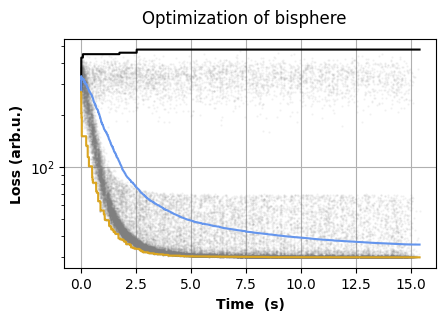

Overall number of candidates evaluated: 38912


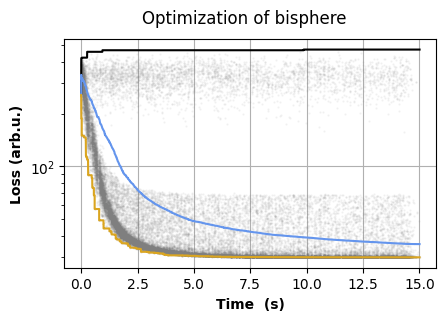

Overall number of candidates evaluated: 38912
birastrigin
[1891115, 1891120, 1891112, 1891118, 1891116, 1891113, 1891119, 1891111, 1891117, 1891114]


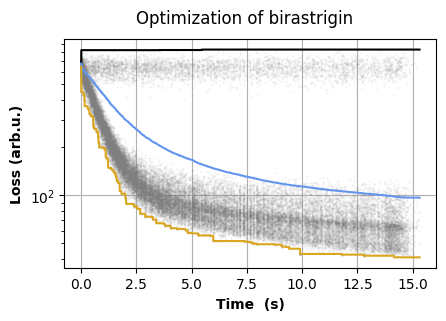

Overall number of candidates evaluated: 38912


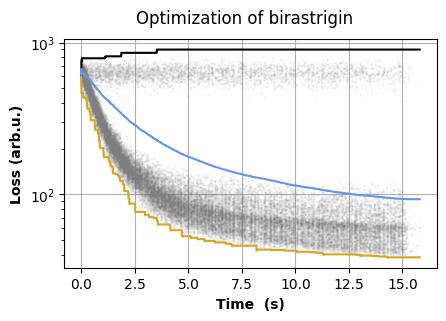

Overall number of candidates evaluated: 38912


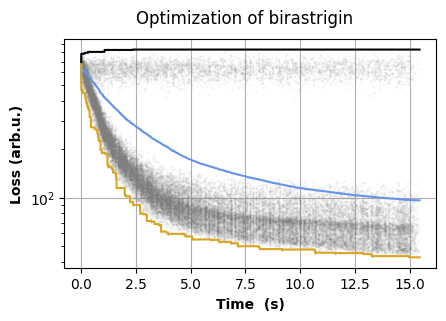

Overall number of candidates evaluated: 38912


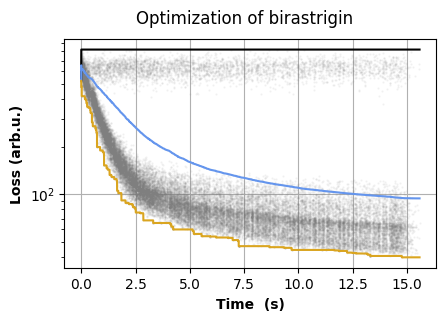

Overall number of candidates evaluated: 38912


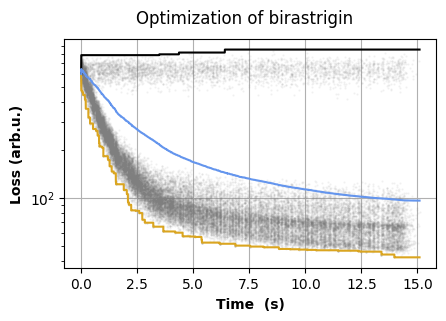

Overall number of candidates evaluated: 38912


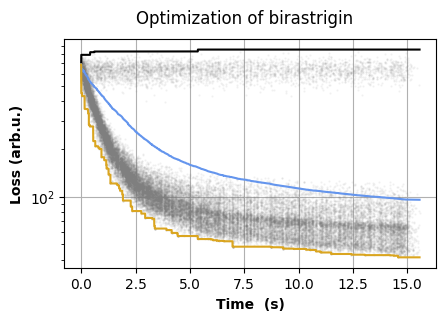

Overall number of candidates evaluated: 38912


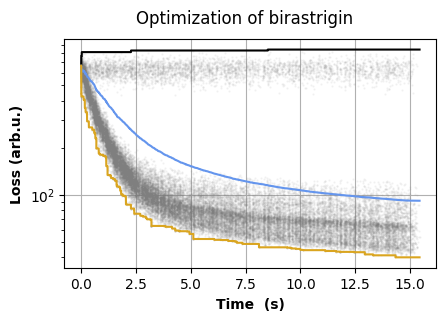

Overall number of candidates evaluated: 38912


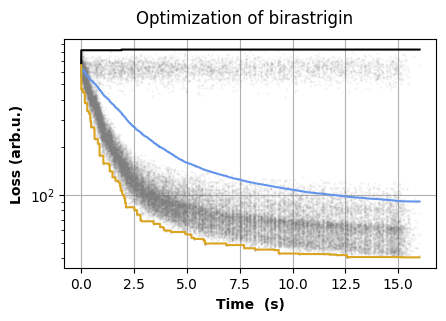

Overall number of candidates evaluated: 38912


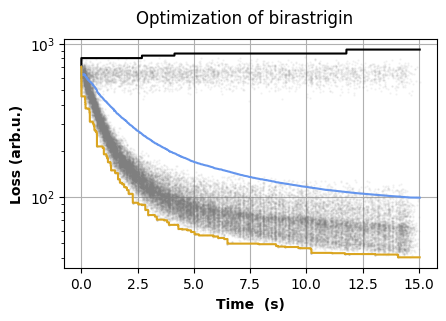

Overall number of candidates evaluated: 38912


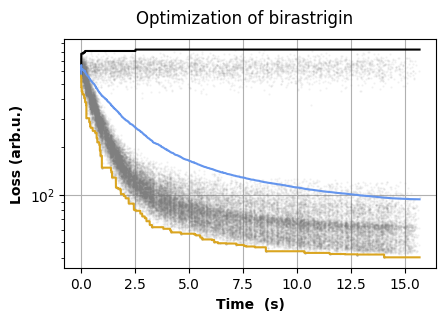

Overall number of candidates evaluated: 38912


In [9]:
# load all them runs
#propulate
propulate_funcbench_results = {fname: [] for fname in function_names}
for fname in function_names:
    path = root + '/' + fname + '/propulate/'
    run_ids = None
    print(fname)
    for subdir, dirs, files in os.walk(path):
        if len(dirs) > 0:
            run_ids = [int(x) for x in dirs]
            print(run_ids)
            break
            
    for run_id in run_ids:
        path = root + f'/{fname}/propulate/{run_id}/'
        num_isles = len(os.listdir(path)) // 2
        
        pops = load_propulate(path, num_isles)
        times, losses = get_propulate_times_losses(pops)
        mini, medi, maxi = get_running(losses)
        plot_loss_evolution(times, losses, mini, medi, maxi, fname=fname)
            
        minidx = np.argmin(losses)
            
        propulate_funcbench_results[fname].append((times[minidx], losses[minidx]))


with open('prop_func_bench.pkl', 'wb') as f:
    pickle.dump(propulate_funcbench_results, f)

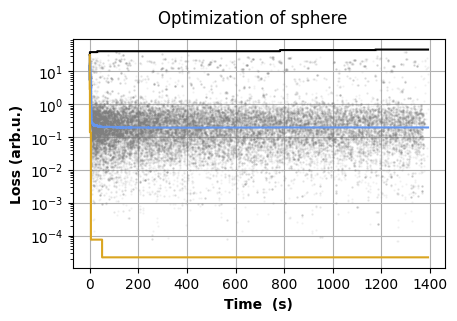

Overall number of candidates evaluated: 38912


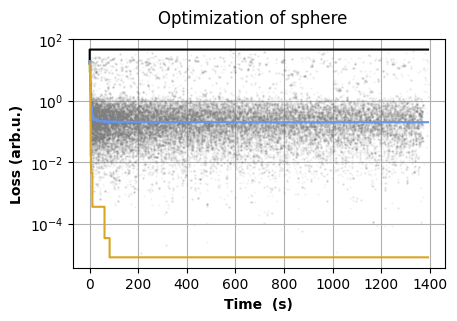

Overall number of candidates evaluated: 38912


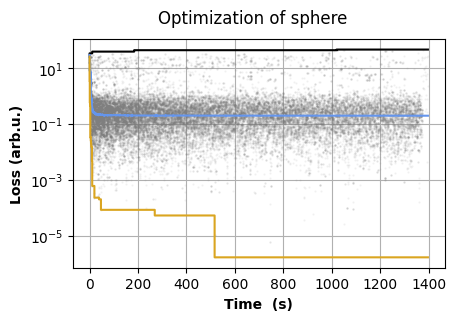

Overall number of candidates evaluated: 38912


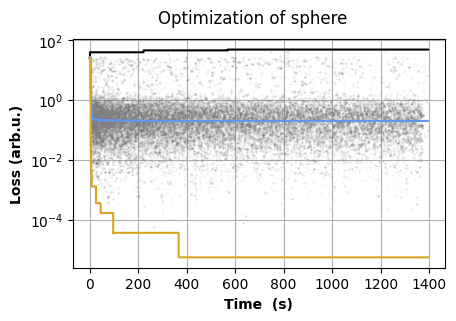

Overall number of candidates evaluated: 38912


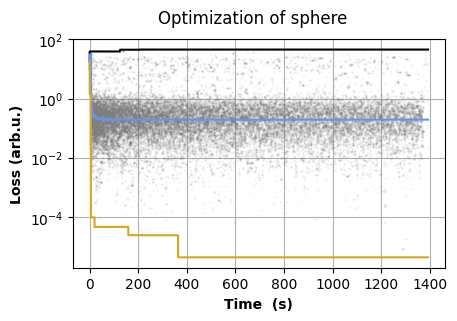

Overall number of candidates evaluated: 38912


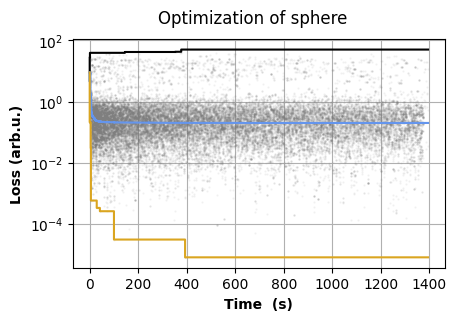

Overall number of candidates evaluated: 38912


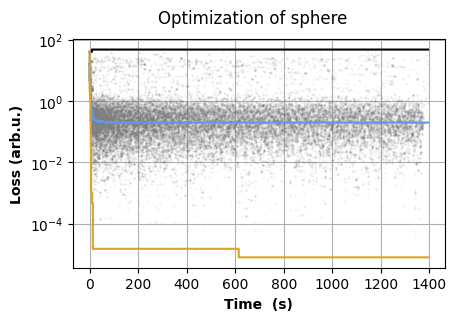

Overall number of candidates evaluated: 38912


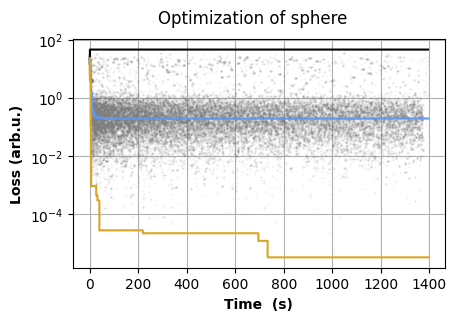

Overall number of candidates evaluated: 38912


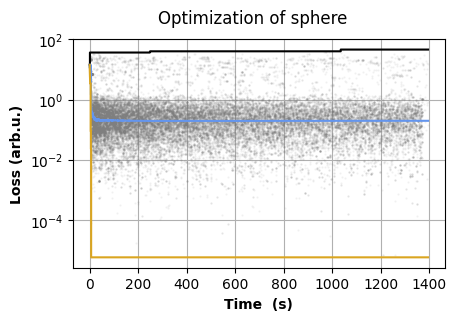

Overall number of candidates evaluated: 38912


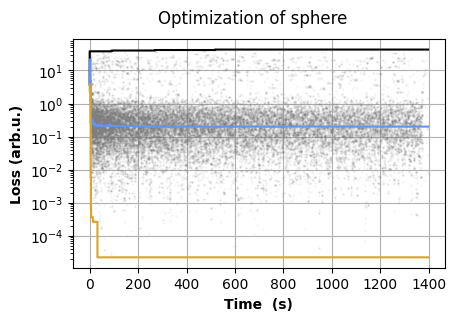

Overall number of candidates evaluated: 38912


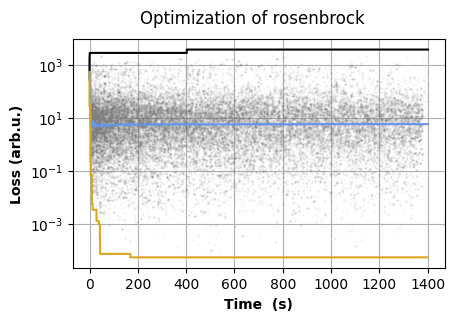

Overall number of candidates evaluated: 38912


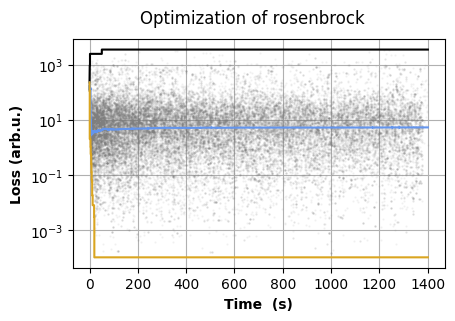

Overall number of candidates evaluated: 38912


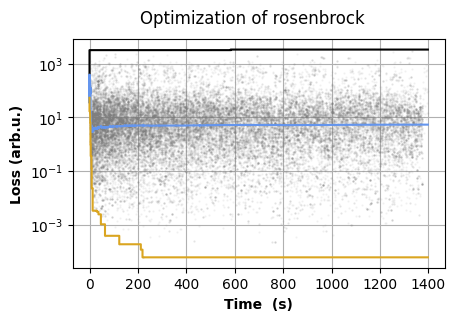

Overall number of candidates evaluated: 38912


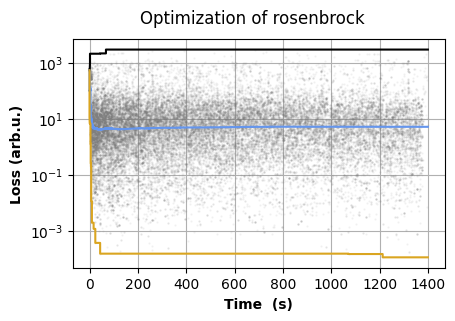

Overall number of candidates evaluated: 38912


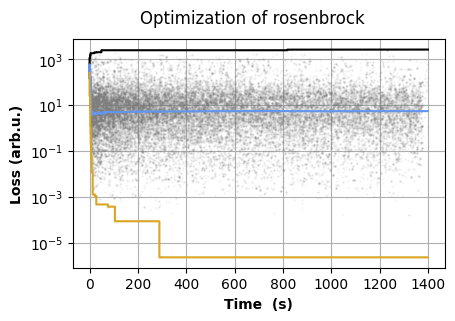

Overall number of candidates evaluated: 38912


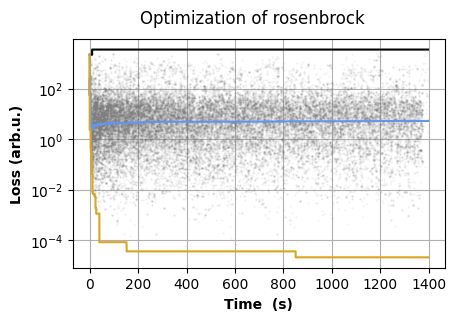

Overall number of candidates evaluated: 38912


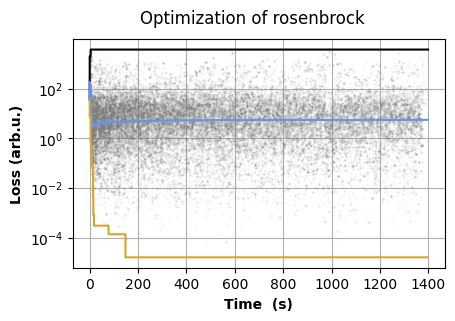

Overall number of candidates evaluated: 38912


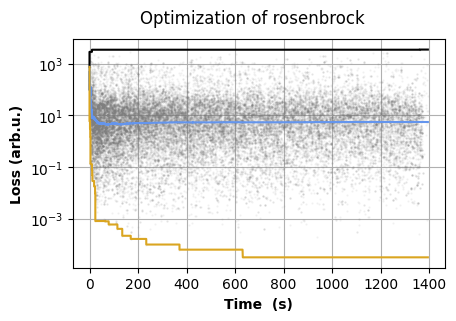

Overall number of candidates evaluated: 38912


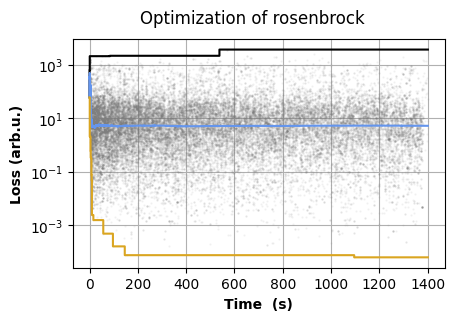

Overall number of candidates evaluated: 38912


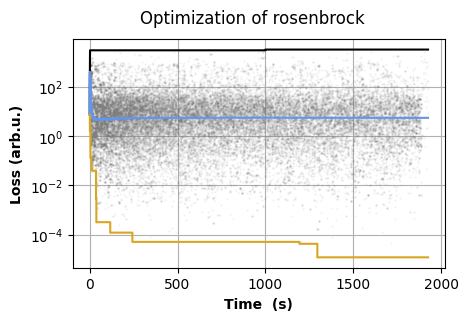

Overall number of candidates evaluated: 38912


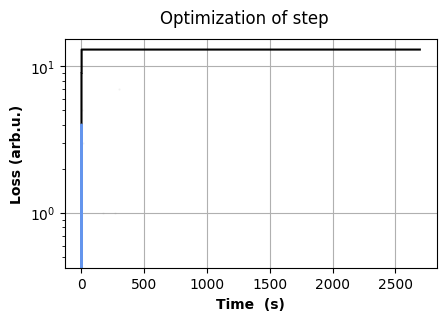

Overall number of candidates evaluated: 38912


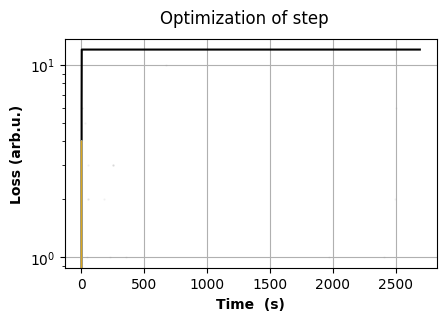

Overall number of candidates evaluated: 38912


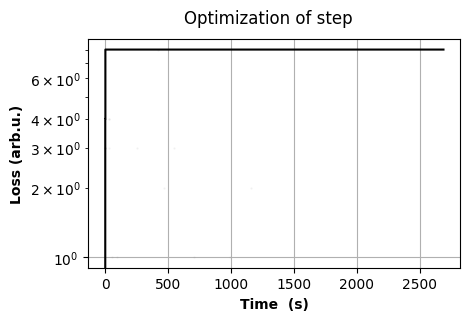

Overall number of candidates evaluated: 38912


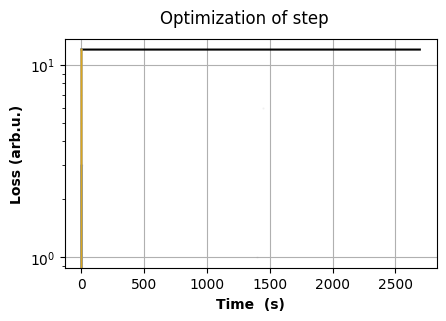

Overall number of candidates evaluated: 38912


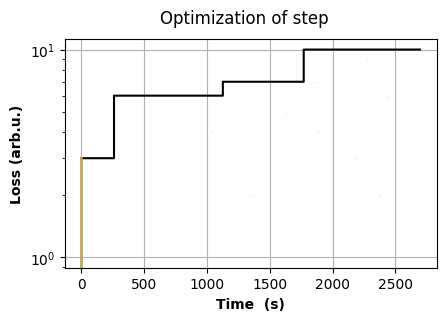

Overall number of candidates evaluated: 38912


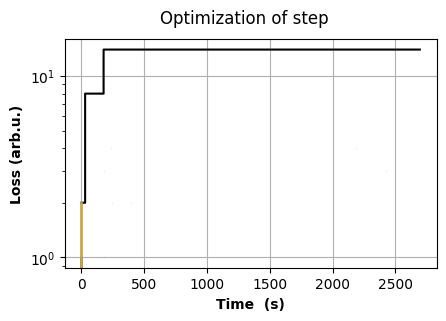

Overall number of candidates evaluated: 38912


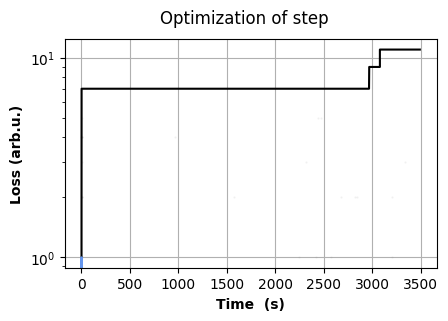

Overall number of candidates evaluated: 38912


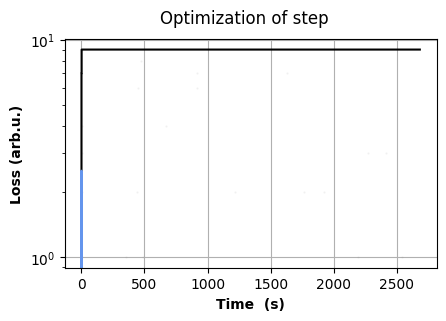

Overall number of candidates evaluated: 38912


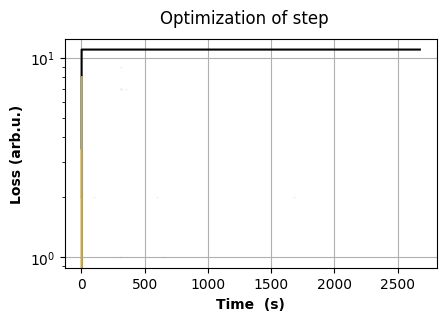

Overall number of candidates evaluated: 38912


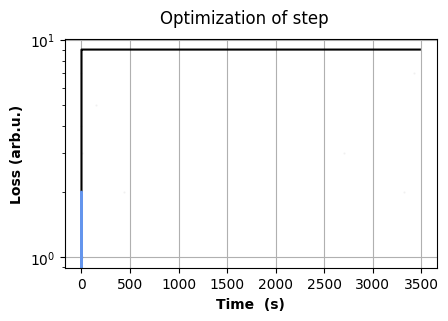

Overall number of candidates evaluated: 38912


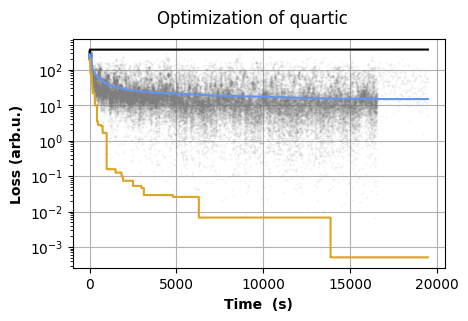

Overall number of candidates evaluated: 38912


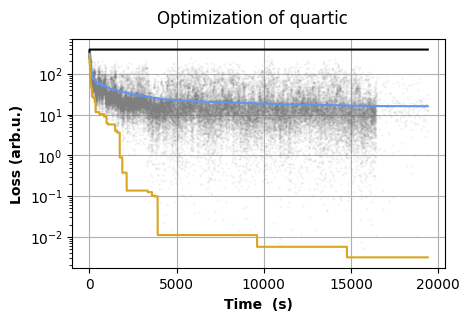

Overall number of candidates evaluated: 38912


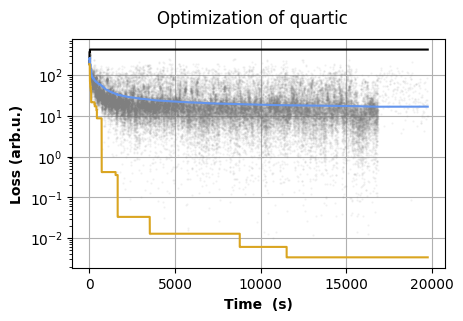

Overall number of candidates evaluated: 38912


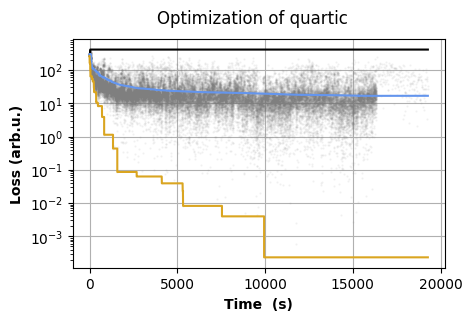

Overall number of candidates evaluated: 38912


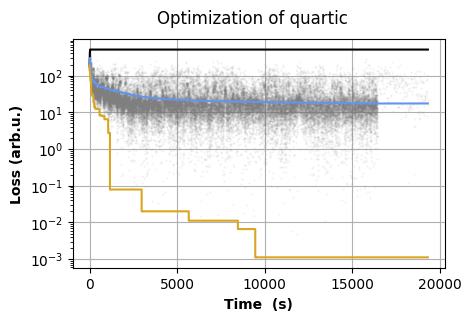

Overall number of candidates evaluated: 38912


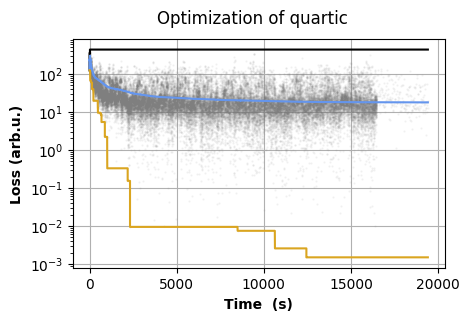

Overall number of candidates evaluated: 38912


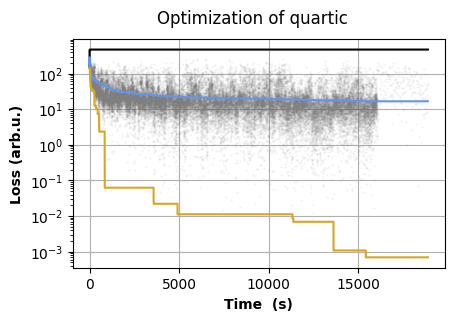

Overall number of candidates evaluated: 38912


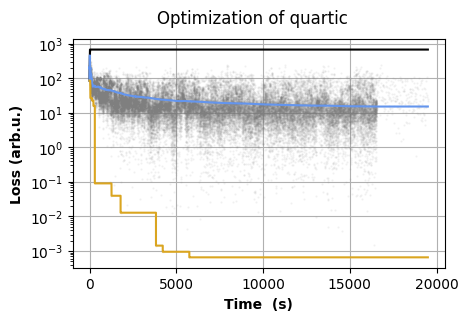

Overall number of candidates evaluated: 38912


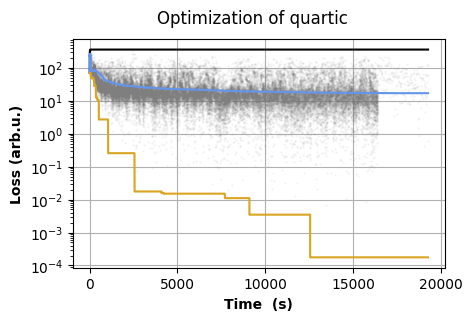

Overall number of candidates evaluated: 38912


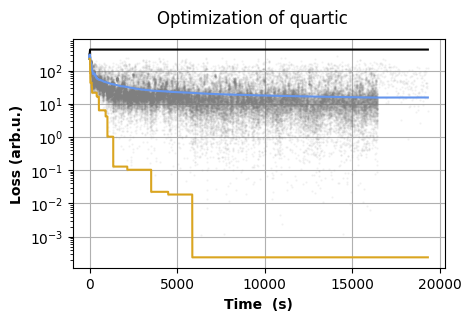

Overall number of candidates evaluated: 38912


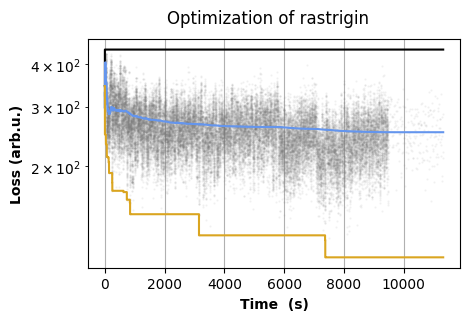

Overall number of candidates evaluated: 38912


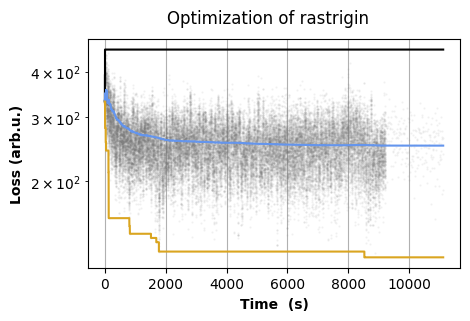

Overall number of candidates evaluated: 38912


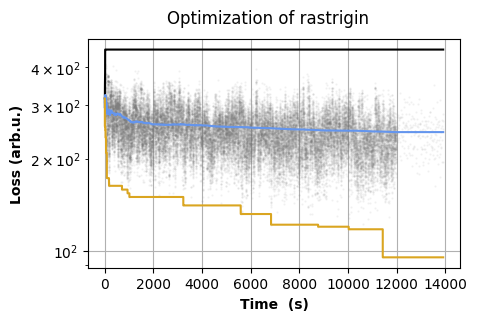

Overall number of candidates evaluated: 38912


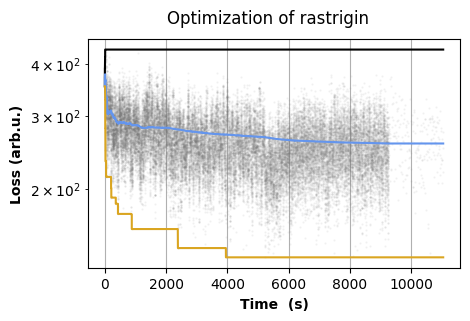

Overall number of candidates evaluated: 38912


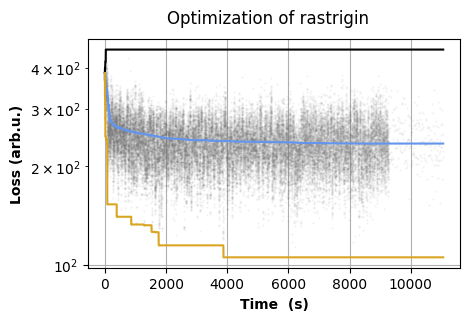

Overall number of candidates evaluated: 38912


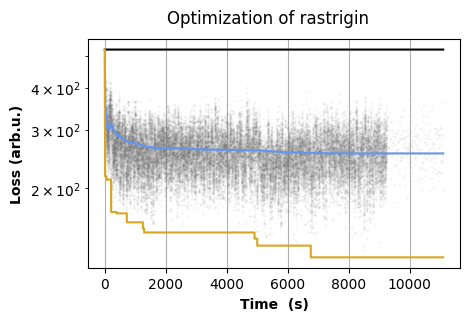

Overall number of candidates evaluated: 38912


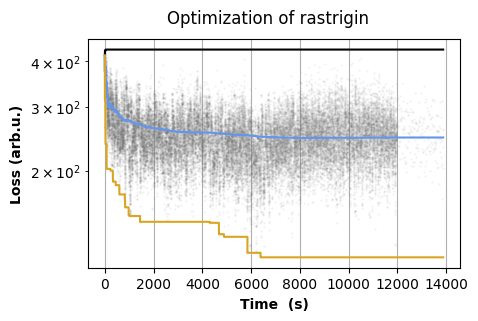

Overall number of candidates evaluated: 38912


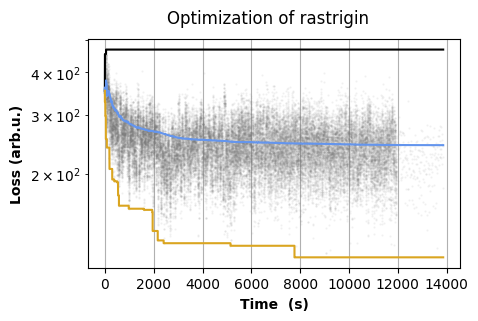

Overall number of candidates evaluated: 38912


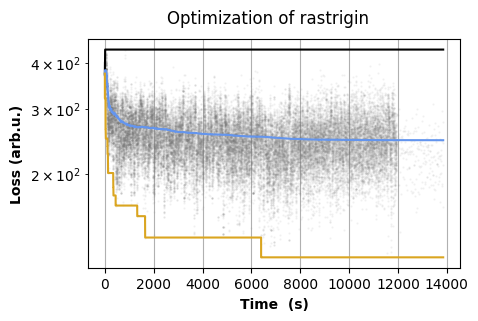

Overall number of candidates evaluated: 38912


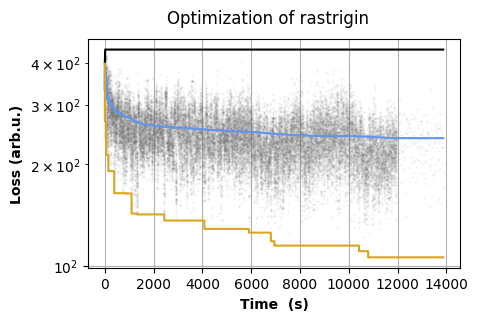

Overall number of candidates evaluated: 38912


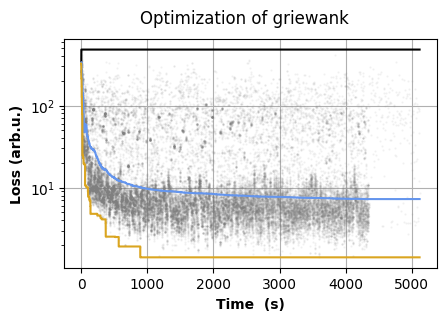

Overall number of candidates evaluated: 38912


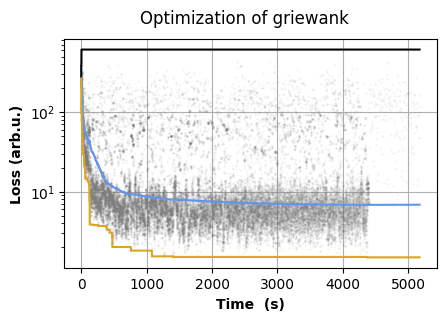

Overall number of candidates evaluated: 38912


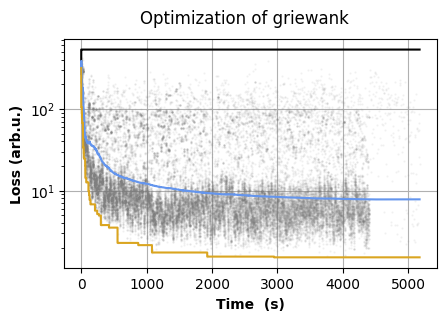

Overall number of candidates evaluated: 38912


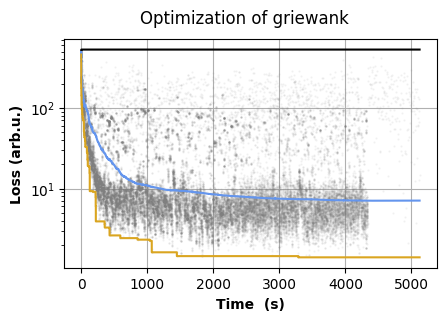

Overall number of candidates evaluated: 38912


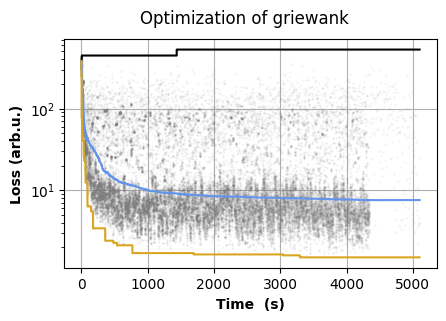

Overall number of candidates evaluated: 38912


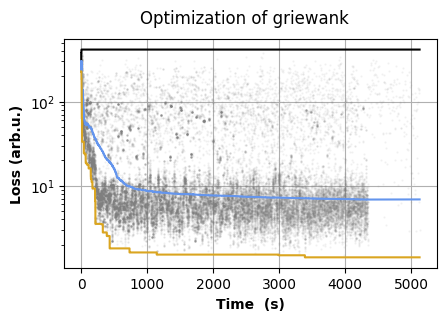

Overall number of candidates evaluated: 38912


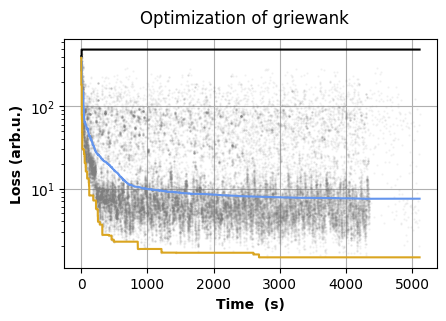

Overall number of candidates evaluated: 38912


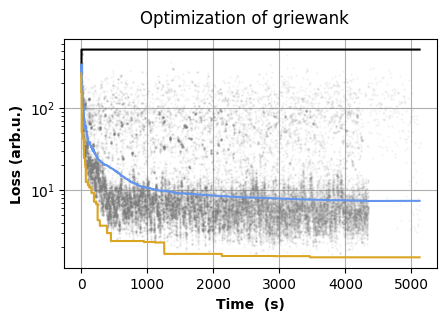

Overall number of candidates evaluated: 38912


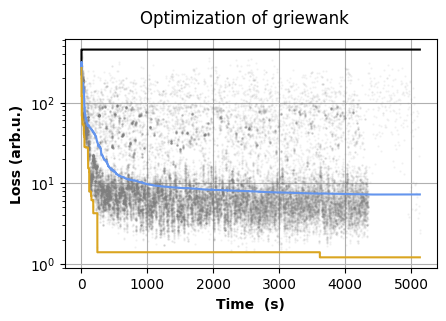

Overall number of candidates evaluated: 38912


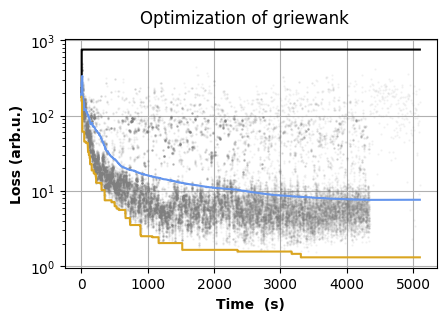

Overall number of candidates evaluated: 38912


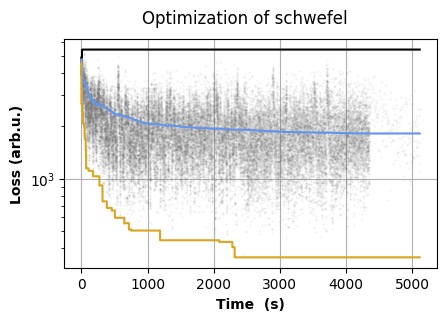

Overall number of candidates evaluated: 38912


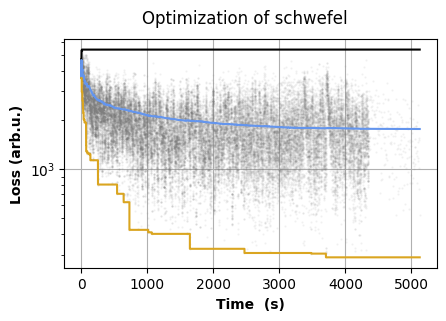

Overall number of candidates evaluated: 38912


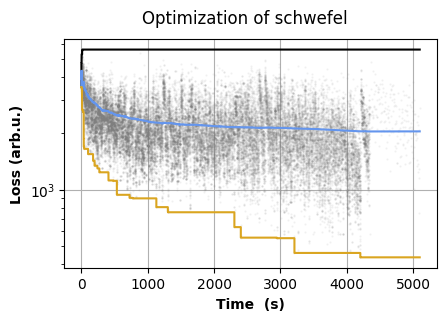

Overall number of candidates evaluated: 38912


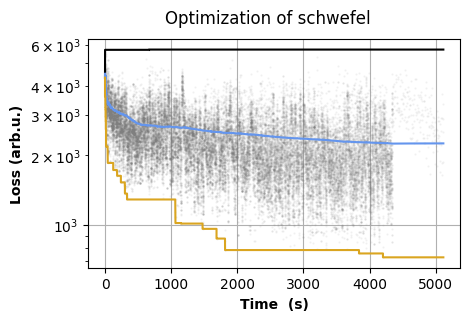

Overall number of candidates evaluated: 38912


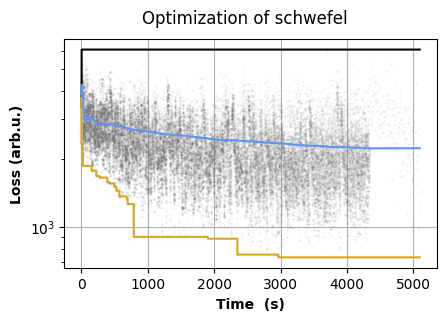

Overall number of candidates evaluated: 38912


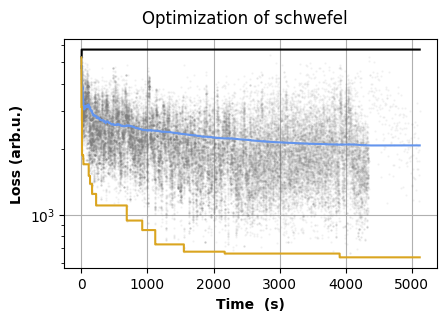

Overall number of candidates evaluated: 38912


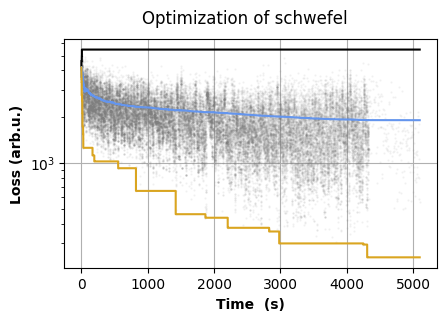

Overall number of candidates evaluated: 38912


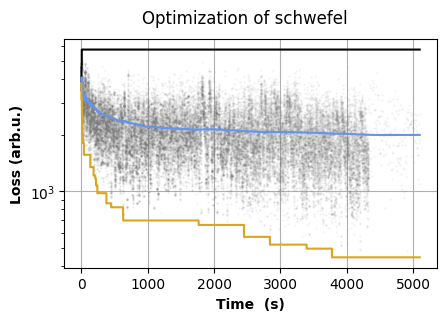

Overall number of candidates evaluated: 38912


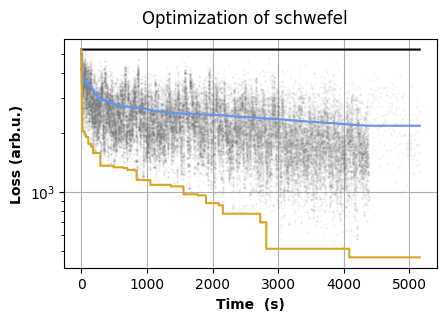

Overall number of candidates evaluated: 38912


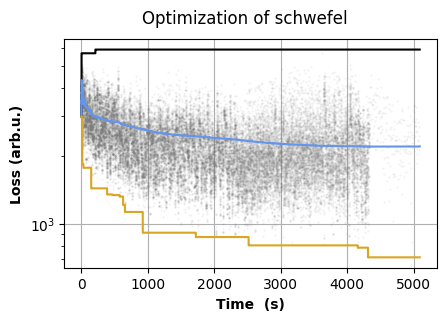

Overall number of candidates evaluated: 38912


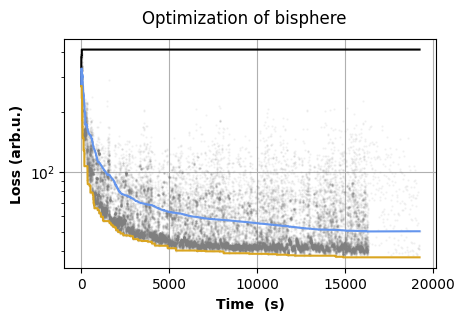

Overall number of candidates evaluated: 38912


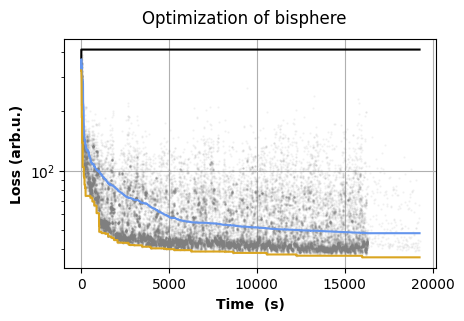

Overall number of candidates evaluated: 38912


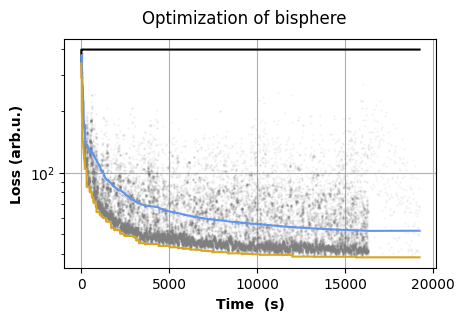

Overall number of candidates evaluated: 38912


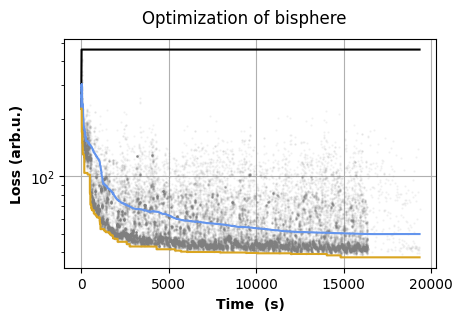

Overall number of candidates evaluated: 38912


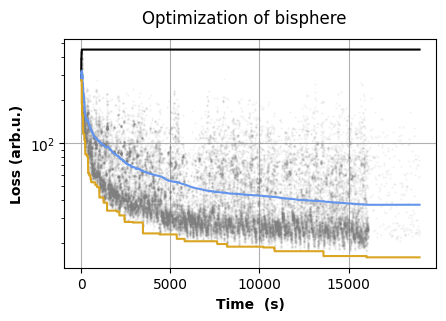

Overall number of candidates evaluated: 38912


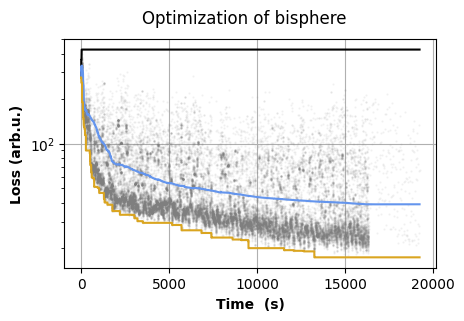

Overall number of candidates evaluated: 38912


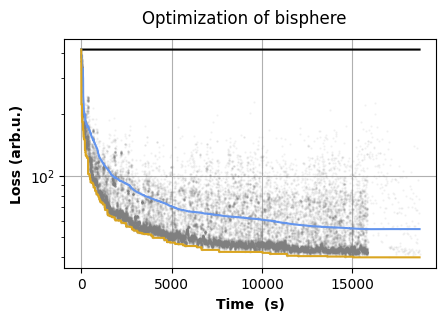

Overall number of candidates evaluated: 38912


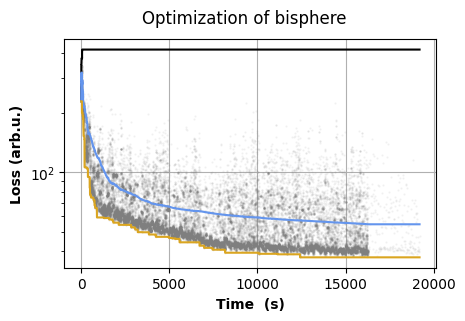

Overall number of candidates evaluated: 38912


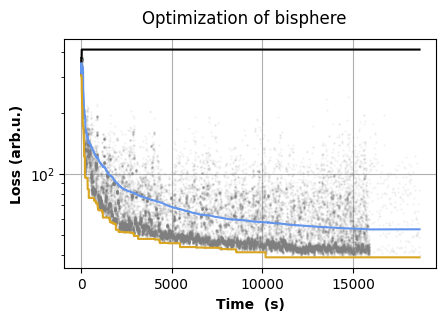

Overall number of candidates evaluated: 38912


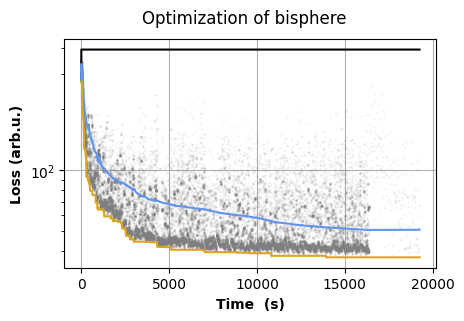

Overall number of candidates evaluated: 38912


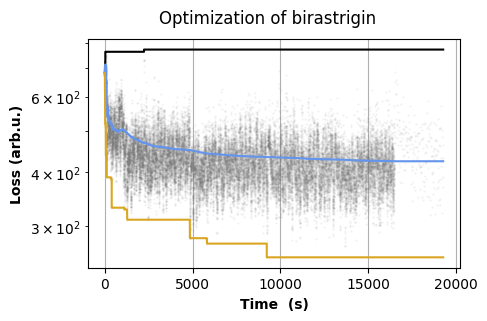

Overall number of candidates evaluated: 38912


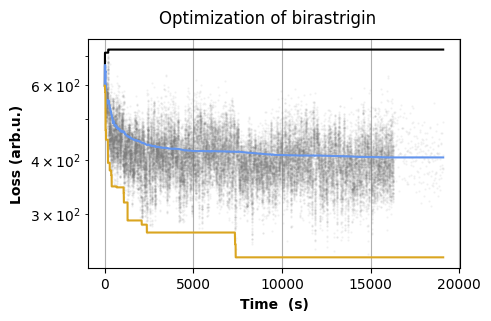

Overall number of candidates evaluated: 38912


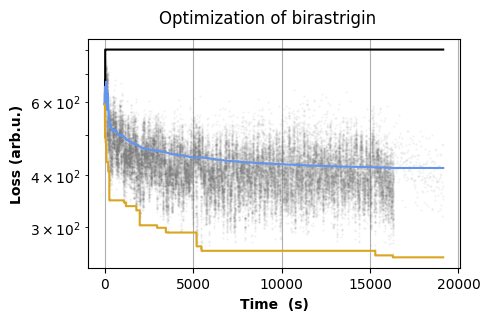

Overall number of candidates evaluated: 38912


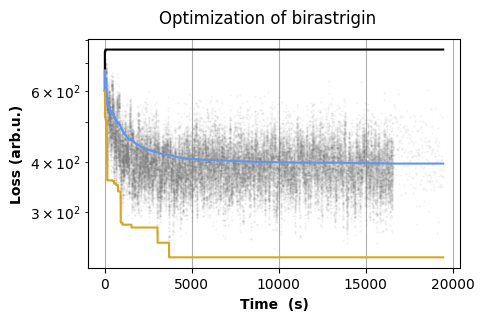

Overall number of candidates evaluated: 38912


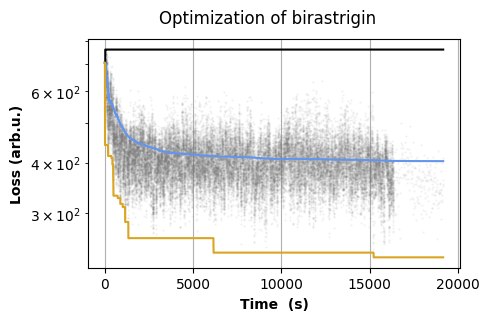

Overall number of candidates evaluated: 38912


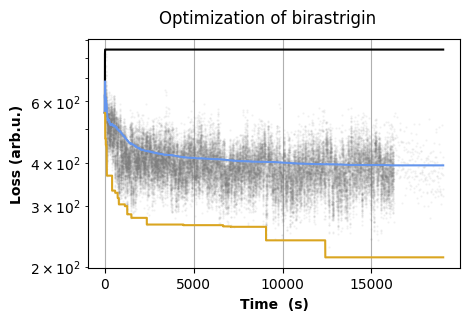

Overall number of candidates evaluated: 38912


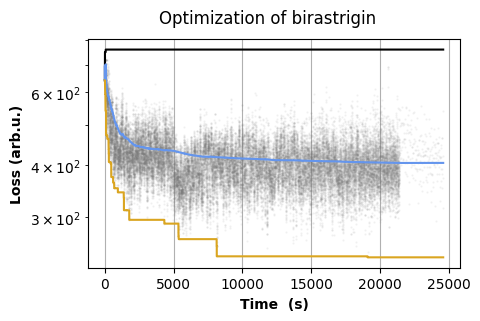

Overall number of candidates evaluated: 38912


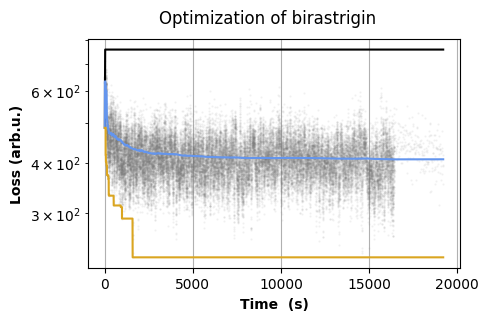

Overall number of candidates evaluated: 38912


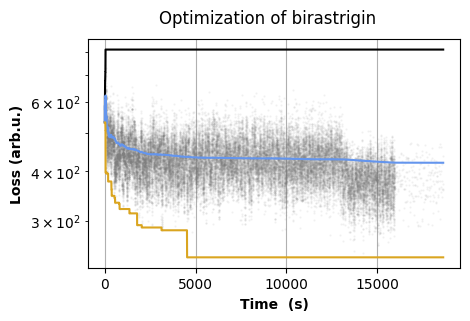

Overall number of candidates evaluated: 38912


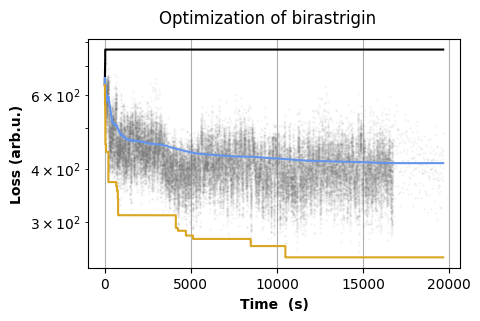

Overall number of candidates evaluated: 38912


In [10]:
# optuna
optuna_funcbench_results = {fname: [] for fname in function_names}
oroot = '/hkfs/work/workspace/scratch/ku4408-Propulate/oskar/propulate-eps/function_benchmark/results/'
for fname in function_names:
    path = oroot + '/' + fname + '/'
    run_ids = None
    for subdir, dirs, files in os.walk(path):
        if len(files) > 0:
            run_ids = [int(x.split('-')[1].split('.')[0]) for x in files]
            break
        # print(subdir, path, files, len(files))
    for run_id in run_ids:
        path = oroot + f'/{fname}/{fname}-{run_id}.csv'
        trial_dfs = load_optuna_csv(path)
        times, losses = get_optuna_times_losses(trial_dfs)
        mini, medi, maxi = get_running(losses)
        plot_loss_evolution(times, losses, mini, medi, maxi, fname=fname)
        
        minidx = np.argmin(losses)
            
        optuna_funcbench_results[fname].append((times[minidx], losses[minidx]))
        
with open('optu_func_bench.pkl', 'wb') as f:
    pickle.dump(optuna_funcbench_results, f)

sphere 6.241837048530579 315.8 6.499505275402754e-07 8.959880511530751e-06
rosenbrock 6.152704787254334 593.2 4.980017118882613e-05 4.850264681877845e-05
step 0.5685080766677857 278.2 -25.0 -25.0
quartic 8.719199061393738 11160.7 0.0008077103762345564 0.0011677152696994
rastrigin 11.22402331829071 7326.2 4.745973590054698 114.76768518737103
griewank 10.719284749031067 3125.4 0.5281828362179155 1.4231058525434375
schwefel 9.390729832649232 3778.2 1.9376001772542621 503.69839166576696
bisphere 14.244492626190185 14409.2 30.04700895243505 33.60471590061298
birastrigin 14.433385634422303 9990.8 40.6091390286241 238.7508460034836


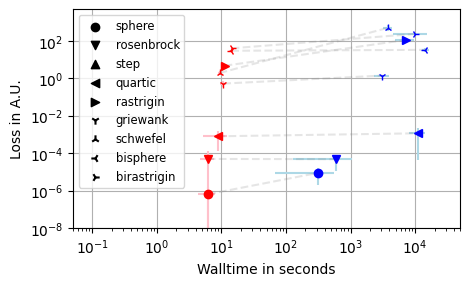

In [11]:
# plot lowest loss over time till lowest loss

markstyles = 'ov^<>1234sp'

if os.path.isfile('prop_func_bench.pkl') and os.path.isfile('optu_func_bench.pkl'):
    with open('prop_func_bench.pkl', 'rb') as f:
        propulate_funcbench_results = pickle.load(f)
    with open('optu_func_bench.pkl', 'rb') as f:
        optuna_funcbench_results = pickle.load(f)

fig, ax = plt.subplots(figsize=(width, height))
for i, fname in enumerate(function_names):
    ax.scatter(0, 0, c='black', marker=markstyles[i], label=fname)
    
    xp = np.mean(np.array([r[0] for r in propulate_funcbench_results[fname]]))
    yp = np.mean(np.array([r[1] for r in propulate_funcbench_results[fname]]))
    xpstd = np.std(np.array([r[0] for r in propulate_funcbench_results[fname]]))
    ypstd = np.std(np.array([r[1] for r in propulate_funcbench_results[fname]]))
    cp = 'red'
    markerstyle = markstyles[i]
    # ax.scatter(xp, yp, c=cp, marker=markerstyle)
    ax.errorbar(xp, yp, c=cp, marker=markerstyle, xerr=xpstd, yerr=ypstd, ecolor='pink')
    
    xo = np.mean(np.array([r[0] for r in optuna_funcbench_results[fname]]))
    yo = np.mean(np.array([r[1] for r in optuna_funcbench_results[fname]]))
    xostd = np.std(np.array([r[0] for r in optuna_funcbench_results[fname]]))
    yostd = np.std(np.array([r[1] for r in optuna_funcbench_results[fname]]))
    co = 'blue'
    markerstyle = markstyles[i]
    # ax.scatter(xo, yo, c=co, marker=markerstyle)
    ax.errorbar(xo, yo, c=co, marker=markerstyle, xerr=xostd, yerr=yostd, ecolor='lightblue')
    
    ax.plot([xp, xo], [yp, yo], color='gray', linestyle='dashed', alpha=0.2)
    print(fname, xp, xo, yp, yo)
        
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlabel("Walltime in seconds")
ax.set_ylabel("Loss in A.U.")

ax.set_xlim(0.05, 5e4)
ax.set_ylim(1e-8, 5e3)
ax.legend(fontsize='small')
ax.grid()
plt.tight_layout()

plt.savefig('function_benchmark.pdf')
plt.show()
    
# Question: should weleave out step and do a log scale?

Results plots:
Something is wrong with the scaling data.
Many runs don't show the number of ranks they should and individuals are missing

In [9]:
def plot_scaling(times, num_evals):
    plt.scatter(times, num_evals)
    plt.xlabel('time in hours')
    plt.ylabel('number of individuals evaluated')
    plt.show()
    return

def plot_speedup(num_ranks, speedups):
    plt.scatter(num_ranks, speedups)
    plt.plot(num_ranks)
    plt.ylabel('speedup')
    plt.xlabel('ranks')
    plt.show()
    return

def plot_efficiency(num_ranks, ):
    return

def plot_time_till_converged(nums_ranks, times):
    plt.scatter(nums_ranks, times)
    plt.ylabel('time in hours')
    plt.xlabel('rannks')
    plt.show()
    return

Weak Scaling

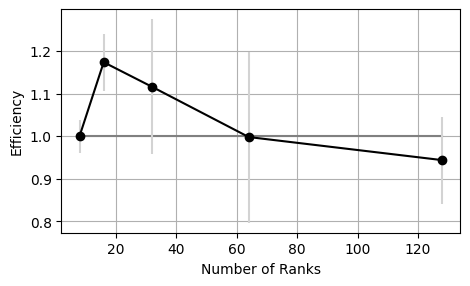

In [ ]:
weak_root = "/hkfs/work/workspace/scratch/qv2382-propulate/bigearthnet_kit/checkpoints/weak"
weak_log_root = "/hkfs/work/workspace/scratch/qv2382-propulate/bigearthnet_kit/logs/scaling"

times = []
sizes = []
nums_evals = []

job_ids = [
# 2-420-weak-
    1896364,
# 2-666-weak-
    1896366,
# 2-69-weak-
    1896365,
# 4-420-weak-
    1896367,
# 4-666-weak-
    1896369,
# 4-69-weak-
    1896368,
# 8-420-weak-
    1896370,
# 8-666-weak-
    1896372,
# 8-69-weak-
    1896371,
# 16-69 
    1896374,
    # *node crash at end slurm-16-420-weak-
    1896373,
    # *node crash at end slurm-16-666-weak-
    1896375,
# 32-420-weak-
    1896376,
# 32-666-weak-
    1896378,
# 32-69-weak-
    1896377,
]

times = {}
nums_evals = {}
logtimes = {}

weak_pickle = 'weak_logtimes.pkl'
if not os.path.isfile(weak_pickle):
    i=0
    colors = ['red', 'blue', 'green', 'yellow', 'purple']*3

    # Have to scale it down to fit string and weak plots next to each other on the page
    # fig, ax = plt.subplots(figsize=(width* .5, height *.5))
    fig, ax = plt.subplots(figsize=(width, height))
    for job_id in job_ids:
        subdir = weak_root + f'/{job_id}/'
    # for subdir, dirs, files in os.walk(weak_root):
    #     if len(files) > 0:
            # num_islands = math.ceil(len(files)/2.)
        num_islands = len(os.listdir(subdir)) // 2
            # print(files)
            # for f in files:
        pops = load_propulate(subdir, num_islands//2)
        prop_times, losses = get_propulate_times_losses(pops)
        time = max(prop_times)
        sol_time, size, num_evals = get_propulate_time_size_evals(pops)
        # print(job_id, size, time/3600, sol_time/3600, num_evals)
        if size not in times:
            times[size] = [time, ]
            nums_evals[size] = [num_evals, ]
        else:
            times[size].append(time)
            nums_evals[size].append(num_evals)

        logfile = weak_log_root + '/' + [x for x in os.listdir(weak_log_root) if x.endswith(str(job_id))][0]
        # with open(logfile, 'rt') as lf:
            # print(lf.readlines()[-7][20:])
            # times = [datetime.datetime.strptime(x, '%Y-%m-%d %H:%M:%S') for x in dataframe['datetime_complete'].to_list()]
            # pass
        with open(logfile, 'rt') as lf:
            lines = lf.readlines()
            # print(lines[-1])
            if lines[-1].startswith('Average node power draw'):
                startlineoffset = -6
                endlineoffset = -5
            else:
                startlineoffset = -4
                endlineoffset = -3

            startline = lines[startlineoffset]
            endline = lines[endlineoffset]
            # print(startline, endline)
            # print(logfile)

            starttime = datetime.datetime.strptime(startline[11:].strip(), '%a %b %d %H:%M:%S %Y')
            endtime = datetime.datetime.strptime(endline[9:].strip(), '%a %b %d %H:%M:%S %Y')
            logtime = (endtime - starttime).total_seconds()

            log_ranks = int(logfile.split('/')[-1].split('-')[1]) * 4
            if log_ranks not in logtimes:
                logtimes[log_ranks] = [logtime, ]
            else:
                logtimes[log_ranks].append(logtime)

        # plt.scatter(size+2*i, time, c=colors[i])
        # plt.scatter(size+2*i, sol_time, c=colors[i])
        # plt.scatter(log_ranks+2*i, logtime, c=colors[i])
        # plt.plot([size+2*i, size+2*i], [time, sol_time], c=colors[i])

        i += 1
    with open(weak_pickle, 'wb') as f:
        pickle.dump(logtimes, f)
    
if os.path.isfile(weak_pickle):
    with open(weak_pickle, 'rb') as f:
        logtimes = pickle.load(f)
# avgtimes = np.array([np.mean(times[s]) for s in times])
avglogtimes = np.array([np.mean(logtimes[r]) for r in logtimes])
# efficiency = avgtimes[0] / avgtimes
logt0 = avglogtimes[0]
logefficiency = logt0 / avglogtimes
xs = np.array([s for s in logtimes])
yerr = np.array([np.std([logtimes[r]/logt0]) for r in logtimes])

# print(xs)
# ax.plot(xs, logefficiency)
# for r in logtimes:
#     for t in logtimes[r]:
#         ax.scatter(r, t)
#         print(r, t)
# plt.scatter(sizes, nums_evals)
# plt.show()

ax.plot(xs, [1.,]*len(xs), c='gray')
ax.errorbar(xs, logefficiency, c='black', marker='o', yerr=yerr, ecolor='lightgray')
# plt.plot(sizes, speedups)
# plt.plot(xs, efficiency)
# ax.plot(xs, [1.]*len(avgtimes))

ax.set_xlabel("Number of Ranks")
ax.set_ylabel("Efficiency")

ax.grid()
plt.tight_layout()

plt.savefig('weak_efficiency.pdf')
plt.show()

Strong Scaling

1909657 8 /hkfs/work/workspace/scratch/qv2382-propulate/bigearthnet_kit/logs/scaling/slurm-2-420-strong-1909657
1909659 8 /hkfs/work/workspace/scratch/qv2382-propulate/bigearthnet_kit/logs/scaling/slurm-2-666-strong-1909659
1909658 8 /hkfs/work/workspace/scratch/qv2382-propulate/bigearthnet_kit/logs/scaling/slurm-2-69-strong-1909658
1892083 16 /hkfs/work/workspace/scratch/qv2382-propulate/bigearthnet_kit/logs/scaling/slurm-4-420-strong-1892083
1892087 16 /hkfs/work/workspace/scratch/qv2382-propulate/bigearthnet_kit/logs/scaling/slurm-4-666-strong-1892087
1892085 16 /hkfs/work/workspace/scratch/qv2382-propulate/bigearthnet_kit/logs/scaling/slurm-4-69-strong-1892085
1892093 32 /hkfs/work/workspace/scratch/qv2382-propulate/bigearthnet_kit/logs/scaling/slurm-8-666-strong-1892093
1892091 32 /hkfs/work/workspace/scratch/qv2382-propulate/bigearthnet_kit/logs/scaling/slurm-8-69-strong-1892091
1891064 64 /hkfs/work/workspace/scratch/qv2382-propulate/bigearthnet_kit/logs/scaling/slurm-16-420-str

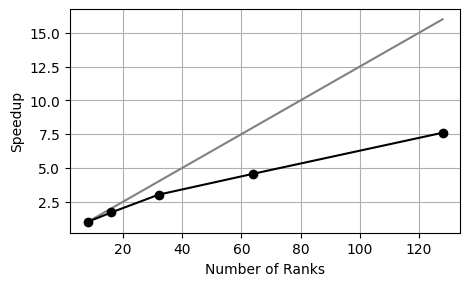

In [ ]:

times = []
sizes = []
nums_evals = []
logtimes = {}

# job_ids = [
    # 
#     1891064,
#     1891068,
#     1891066,
#     1891070,
#     1891074,
#     1891072,
#     1892083,
#     1892087,
#     1892085,
#     1891058,
#     1892089,
#     1891062,
#     1892093,
#     1891060,
#     1892091,
# ]

# NOTE the two missing ones ran out of time and are excluded
job_ids = [
    # slurm-2-420-strong-
    1909657,
    # slurm-2-666-strong-
    1909659,
    # slurm-2-69-strong-
    1909658,
    # slurm-4-420-strong-
    1892083,
    # slurm-4-666-strong-
    1892087,
    # slurm-4-69-strong-
    1892085,
    # slurm-8-666-strong-
    1892093,
    # slurm-8-69-strong-
    1892091,
    # slurm-16-420-strong-
    1891064,
    # slurm-16-69-strong-
    1891066,
    # slurm-32-420-strong-
    1891070,
    # slurm-32-666-strong-
    1891074,
    # slurm-32-69-strong-
    1891072,
]


strong_root = "/hkfs/work/workspace/scratch/qv2382-propulate/bigearthnet_kit/checkpoints/strong"
strong_log_root = "/hkfs/work/workspace/scratch/qv2382-propulate/bigearthnet_kit/logs/scaling"
# for subdir, dirs, files in os.walk(strong_root):
#     print(subdir)
strong_pickle = 'strong_logtimes.pkl'
if not os.path.isfile(strong_pickle):
    fig, ax = plt.subplots(figsize=(width, height))
    for job_id in job_ids:
        subdir = strong_root + f'/{job_id}/'
        # print(subdir)
        # if len(files) > 0:
        # if len(os.listdir(subdir)) > 0:
        #     # num_islands = len(files)//2
        #     # print(os.listdir(subdir))
        #     num_islands = len(os.listdir(subdir)) // 2
        #     # if num_islands == 15:
        #     #     print(os.listdir(subdir))
        #     # print(num_islands)
        #     # print(files)
        #     # for f in files:
        #     pops = load_propulate(subdir, num_islands)
        #     proptimes, losses = get_propulate_times_losses(pops)
        #     time = max(proptimes)
        #     _, size, num_evals = get_propulate_time_size_evals(pops)
        #     times.append(time)
        #     sizes.append(size)
        #     nums_evals.append(num_evals)
        # else:
        #     print(job_id, 'is broken')

        logfile = strong_log_root + '/' + [x for x in os.listdir(strong_log_root) if x.endswith(str(job_id))][0]
        with open(logfile, 'rt') as lf:
            # print(lf.readlines()[-7][20:])
            # times = [datetime.datetime.strptime(x, '%Y-%m-%d %H:%M:%S') for x in dataframe['datetime_complete'].to_list()]
            # logtime = datetime.datetime.strptime(lf.readlines()[-7][20:], '')
            # logtimes.append(logtime)
            lines = lf.readlines()
            # print(lines[-1])
            if lines[-1].startswith('Average node power draw'):
                startlineoffset = -6
                endlineoffset = -5
            else:
                startlineoffset = -4
                endlineoffset = -3

            log_ranks = int(logfile.split('/')[-1].split('-')[1]) * 4
            startline = lines[startlineoffset]
            endline = lines[endlineoffset]
            # print(startline, endline)
            # print(logfile)

            starttime = datetime.datetime.strptime(startline[11:].strip(), '%a %b %d %H:%M:%S %Y')
            endtime = datetime.datetime.strptime(endline[9:].strip(), '%a %b %d %H:%M:%S %Y')
            logtime = (endtime - starttime).total_seconds()
            if log_ranks not in logtimes:
                logtimes[log_ranks] = [logtime, ]
            else:
                logtimes[log_ranks].append(logtime)
        print(job_id, log_ranks, logfile)
    with open(strong_pickle, 'wb') as f:
        pickle.dump(logtimes, f)
    
if os.path.isfile(strong_pickle):
    with open(strong_pickle, 'rb') as f:
        logtimes = pickle.load(f)
avglogtimes = np.array([np.mean(logtimes[r]) for r in logtimes])
# efficiency = avgtimes[0] / avgtimes
logt0 = avglogtimes[0]
# logefficiency = logt0 / avglogtimes
logspeedup = logt0 / avglogtimes
xs = np.array([s for s in logtimes])
yerr = np.array([np.std([logtimes[r]/logt0]) for r in logtimes])

print(xs)
print(xs / xs[0])
print(logspeedup)
print(yerr)
# for r in logtimes:
#     for t in logtimes[r]:
#         print(r, t)
#         ax.scatter(r, t/3600)
# plt.show()

ax.plot(xs, xs / xs[0], c='grey')
ax.errorbar(xs, logspeedup, c='black', marker='o', yerr=yerr, ecolor='lightgray')
# plt.plot(sizes, speedups)
# plt.plot(xs, efficiency)
# ax.plot(xs, [1.]*len(avgtimes))

ax.set_xlabel("Number of Ranks")
ax.set_ylabel("Speedup")

ax.grid()
plt.tight_layout()

plt.savefig('strong_speedup.pdf')
plt.show()


Time till converge

In [ ]:
propulate_job_ids = [
    # 8 1337
    # 8 80085
    # 8 815
    # 8 420
    1896626,
]

optuna_job_ids = [
    # 8 1337
    1900361,
    # 8 80085
    1900335,
    # 8 815
    1900368
    # 8 420
]



times = []
sizes = []
nums_evals = []

failures = ['1866404']
time_root = "/hkfs/work/workspace/scratch/qv2382-propulate/bigearthnet_kit/checkpoints/time"
for subdir, dirs, files in os.walk(time_root):
    if subdir.endswith(failures[0]):
        continue
    if len(files) > 0 and (len(files)%2==0):
        num_islands = len(files)//2
        # print(subdir, files)
        # for f in files:
        pops = load_propulate(subdir, len(files)//2)
        time, size, num_evals = get_propulate_time_size_evals(pops)
        times.append(time)
        sizes.append(size)
        nums_evals.append(num_evals)


plot_time_till_converged(sizes, times)